In [12]:
import numpy as np
import cupy as cp
import pandas as pd
import matplotlib.pyplot as plt
from functools import reduce
from numpy.linalg import norm
from layer import Close_to_data_wage_init
from kohonen_network_learning import AlphaFun, DecreasingDistFun

import main
data = main.load_data()

data_c1 = data[data[10]==1.0]
data_c0 = data[data[10]==0.0]
data_nn = data[data[9].notnull()]
data_c1_nn = data_nn[data_nn[10]==1.0]
data_c0_nn = data_nn[data_nn[10]==0.0]

import neural_network
import kohonen_network_learning

dane = cp.array(data_nn)[:, 0:10]

wage_init = Close_to_data_wage_init(dane, 0.0)
network = neural_network.Kohonen2DNetwork(100, 10, wage_init)

(10, 100)


In [13]:
data_s = main.load_data_standaryzation()

In [14]:
data_s_c1 = data[data[10]==1.0]
data_s_c0 = data[data[10]==0.0]
data_s_nn = data[data[9].notnull()]
data_s_c1_nn = data_nn[data_nn[10]==1.0]
data_s_c0_nn = data_nn[data_nn[10]==0.0]

dane = cp.array(data_s_nn)[:, 0:10]

In [15]:
%matplotlib inline
n_bins = 50

def histogram_s(axis, data = data_s, n_bins = n_bins):
    fig, axs = plt.subplots(1, 3, sharey=False)
    axs[0].hist(np.array(data.T)[axis], bins=n_bins)    
    axs[1].hist(np.array(data[data[10]==0.0].T)[axis], bins=n_bins)
    axs[2].hist(np.array(data[data[10]==1.0].T)[axis], bins=n_bins)

In [31]:
dane_c1 = cp.array(data_s_c1_nn)[:, 0:10]
dane_c0 = cp.array(data_s_c0_nn)[:, 0:10]

def push(lis, el):
    lis.append(el)
    return lis

def draw(dane, network):
    layer = network.layers
    indexes_max = np.zeros(layer.number_of_neurons())
    indexes = list(map(lambda x, layer=layer: layer.find_best_neuron_by_dot_product(x), dane))
    for index in indexes:
        indexes_max[index]+=1
    existing_indexes = list(reduce(lambda existing_indexes, index: push(existing_indexes, index) if index[1]>0 else existing_indexes , enumerate(indexes_max), []))
#     print(existing_indexes)
    return existing_indexes

In [32]:
procentage_return_of_draw = lambda ret, number: list(map(lambda el, number = number: (el[0] , int(el[1]), el[1]/number) ,ret))

def merge(procentage_c0, procentage_c1, it_0=0, it_1=0, ret = []):
    if it_0 ==0 and it_1 ==0:
        ret = []  

    if len(procentage_c0)<=it_0 and len(procentage_c1)<=it_1: #warunek końca
#         print(ret)
        return ret
    if len(procentage_c0)<=it_0:
        ret.append((procentage_c1[it_1][0], 1., procentage_c1[it_1][1]))
        return merge(procentage_c0, procentage_c1, it_0, it_1+1, ret)
    if len(procentage_c1)<=it_1:
        ret.append((procentage_c0[it_0][0], 0., procentage_c0[it_0][1]))
        return merge(procentage_c0, procentage_c1, it_0+1, it_1, ret)
    
    id_c0 = procentage_c0[it_0][0]
    id_c1 = procentage_c1[it_1][0]    
    ct_c0 = procentage_c0[it_0][1]
    ct_c1 = procentage_c1[it_1][1]  
    pr_c0 = procentage_c0[it_0][2]    
    pr_c1 = procentage_c1[it_1][2]    

    if id_c0 == id_c1:
#         print(procentage_c0)
#         print(ct_c1)
        ret.append((id_c0, pr_c1/(pr_c0 + pr_c1), ct_c0+ct_c1))
        it_0+=1
        it_1+=1
    if id_c0 < id_c1:
        ret.append((id_c0, 0., ct_c0))
        it_0+=1
    if id_c1 < id_c0:
        ret.append((id_c1, 1., ct_c1))
        it_1+=1
        
    return merge(procentage_c0, procentage_c1, it_0, it_1, ret)

In [33]:
import pylab as p
from math import sqrt
#dziala gdy liczba neuronow juest pierwiastkowalna na liczbe calkowita (zreszta jak i siec)

def prep_to_map(network):
    pr_c0 = procentage_return_of_draw(draw(dane_c0, network), len(dane_c0))
    pr_c1 = procentage_return_of_draw(draw(dane_c1, network), len(dane_c1))
    return [ [el[0], el[1], el[2]/(len(dane_c0) + len(dane_c1)) ] for el in merge(pr_c0, pr_c1)]

prepare_map = lambda network_map: list(
    map(lambda el, network_map = network_map: (network_map.layers.positions[el[0]], el[1], el[2]) , prep_to_map(network_map)))

def prepare_map_print (network_map):
    prep = prepare_map(network_map)
    print(prep)
    return prep

def to_map_array(prepare_map_el, neurons, multiply=4):
    m = multiply
    neurons = int(neurons)
    map_array = np.array([[[1.,1.,1.]]]*neurons).reshape(int(sqrt(neurons)),int(sqrt(neurons)),3)

    def tmp(el, map_array = map_array):
        position = el[0]
        cl_pr = el[1]    #class_procent
        pr_of_all = el[2] # procent_of_all
        map_array[int(position[0]), int(position[1])] -= [ m*(cl_pr * pr_of_all) ,  m*(pr_of_all) , m*((1-cl_pr) * pr_of_all) ] #RGB
        return map_array
    
    for el in prepare_map_el:
        map_array = tmp(el) 
    return np.array(map_array)

def draw_map(network, it=-1):
    p.ion()
    tmp = to_map_array(prepare_map(network), network.layers.number_of_neurons())
    p.figure(it) if it >= 0 else p.figure()
    p.imshow(tmp, interpolation='bicubic')
    p.draw()
    p.ioff()

In [34]:
def learning_short(dane, epochs, neurons, wage_init = Close_to_data_wage_init(dane, 0.002), dist_fun = DecreasingDistFun(), alpha_fun = AlphaFun(), x_size = 10, if_by_dot_product=False):
    network = neural_network.Kohonen2DNetwork(neurons, x_size, wage_init)
    learning = kohonen_network_learning.KohonenNetworkGauss_nbh(dane, network, 
                                                                dist_fun = dist_fun, 
                                                                alpha_fun = alpha_fun, 
                                                                if_by_dot_product = if_by_dot_product
                                                               )
    return learning.learning(epochs)

def maps_for_return_networks(ret_networks, number_of_iters=-1):
    number_of_iters = len(ret_networks) if number_of_iters < 0 else number_of_iters
    
    p.ion()
    %matplotlib notebook
    for it in range(number_of_iters):
        print("Epoka: " + str(it))
        draw_map(ret_networks[it])

In [22]:
ret_network_100_100_1_a005_d10 = learning_short( dane, 
                                                epochs = 100, 
                                                neurons = 100, 
                                                wage_init = Close_to_data_wage_init(dane, 0.0001), 
                                                alpha_fun = AlphaFun(alpha_0 = 0.005),
                                                dist_fun = DecreasingDistFun(d_0 = 7), 
                                              )

(10, 100)
epoch: 0
[0.44790952 0.81110778 0.03670467 0.06405753 0.12354267 0.03534568
 0.01833958 0.67039914 0.57299229 0.3397152 ]
epoch: 1
[0.48935956 0.76973975 0.04115328 0.0720908  0.13340689 0.04045544
 0.02205135 0.67511205 0.57327129 0.34010169]
epoch: 2
[0.49447991 0.76109413 0.04440029 0.07790532 0.13921211 0.04157775
 0.02602826 0.67192275 0.5660901  0.33798767]
epoch: 3
[0.49588175 0.74697375 0.04347394 0.07683066 0.13802558 0.04221987
 0.02305328 0.67268766 0.5689726  0.34023343]
epoch: 4
[0.49712553 0.74315897 0.04159207 0.07146743 0.13871744 0.04361848
 0.02233407 0.67979767 0.5767258  0.33879427]
epoch: 5
[0.49527056 0.7555094  0.04264669 0.07412    0.14134489 0.0432865
 0.02506613 0.67569711 0.57127885 0.33841979]
epoch: 6
[0.49897598 0.76294663 0.0426537  0.07395215 0.13931085 0.04034795
 0.02238199 0.67572857 0.56991019 0.33792584]
epoch: 7
[0.49885204 0.75088959 0.04425471 0.0744915  0.13740154 0.04102512
 0.02207295 0.67490323 0.57310985 0.34136303]
epoch: 8
[0.501

epoch: 67
[0.48914288 0.76621388 0.0439377  0.07583683 0.13766211 0.040579
 0.0219425  0.67401497 0.57313798 0.33940521]
epoch: 68
[0.4894674  0.76581068 0.04387906 0.0758063  0.13754205 0.0407888
 0.02209042 0.67393721 0.57308447 0.33947975]
epoch: 69
[0.48954001 0.76570253 0.04386722 0.07577973 0.13754555 0.04075857
 0.02207773 0.67394356 0.57311889 0.33952111]
epoch: 70
[0.48956358 0.76572663 0.0438586  0.07576714 0.13752805 0.04075942
 0.02207664 0.67393335 0.57311919 0.33952643]
epoch: 71
[0.48956067 0.76573641 0.04385586 0.07576175 0.13752501 0.04075671
 0.02207559 0.67394371 0.57312091 0.33951965]
epoch: 72
[0.48968217 0.76593733 0.04382524 0.07570141 0.1374919  0.04074321
 0.02206685 0.67389215 0.57305176 0.33947586]
epoch: 73
[0.48993017 0.7653142  0.04387829 0.0758105  0.13750623 0.0406533
 0.02201414 0.67399782 0.57305663 0.33959294]
epoch: 74
[0.48994838 0.76491124 0.0440482  0.07606018 0.13747459 0.04059917
 0.02201186 0.6740814  0.57310502 0.33960885]
epoch: 75
[0.4899483

In [23]:
ret_network_100_100_1_a005_d10_diff = learning_short( dane, 
                                                epochs = 100, 
                                                neurons = 100, 
                                                wage_init = Close_to_data_wage_init(dane, 0.0001), 
                                                alpha_fun = AlphaFun(alpha_0 = 0.005, t = 2.0),
                                                dist_fun = DecreasingDistFun(d_0 = 7, t = 3.0), 
                                              )

(10, 100)
epoch: 0
[0.52734786 0.78858962 0.03651543 0.0566277  0.13585628 0.0315487
 0.01680854 0.67037331 0.56520336 0.33553819]
epoch: 1
[0.50054244 0.78061939 0.04001473 0.06669457 0.13757461 0.03845359
 0.02002755 0.6726407  0.56808067 0.33545983]
epoch: 2
[0.49690298 0.75962403 0.04171816 0.07079374 0.13659904 0.03944825
 0.02189773 0.67991695 0.5768925  0.3390934 ]
epoch: 3
[0.49211812 0.76011958 0.04342052 0.07537687 0.13915136 0.04270198
 0.02283233 0.67765939 0.57372615 0.33857142]
epoch: 4
[0.49446352 0.75519751 0.04481694 0.07858496 0.13604853 0.0383979
 0.02099323 0.67957949 0.57300329 0.34281027]
epoch: 5
[0.49620913 0.74966057 0.04538933 0.08051024 0.13736113 0.04231485
 0.02292875 0.67745231 0.57143204 0.3393985 ]
epoch: 6
[0.49530947 0.7741611  0.04272584 0.07415114 0.13523246 0.03802991
 0.02070378 0.67668012 0.57050548 0.33642128]
epoch: 7
[0.50210654 0.75602448 0.04590982 0.08031069 0.13257759 0.04118604
 0.0226702  0.67250931 0.56776165 0.33771635]
epoch: 8
[0.4991

epoch: 67
[0.49903462 0.74947111 0.04680446 0.07953183 0.1364224  0.03868616
 0.02104449 0.67573768 0.5740416  0.3413632 ]
epoch: 68
[0.49903462 0.74947111 0.04680446 0.07953183 0.1364224  0.03868616
 0.02104449 0.67573768 0.5740416  0.3413632 ]
epoch: 69
[0.49904824 0.74929665 0.04681306 0.07957175 0.13644907 0.0387212
 0.02110358 0.67573802 0.57404175 0.3413555 ]
epoch: 70
[0.49908886 0.74926169 0.04679846 0.07954501 0.13644071 0.03871634
 0.02109921 0.67574887 0.57406897 0.34137125]
epoch: 71
[0.49909045 0.74928064 0.0468003  0.07954999 0.13645171 0.03872621
 0.02110314 0.67573887 0.57404266 0.3413514 ]
epoch: 72
[0.49909026 0.74928805 0.0467972  0.07954519 0.13645    0.03872686
 0.02110551 0.67573724 0.57404167 0.34135725]
epoch: 73
[0.49910607 0.74929935 0.04679375 0.07953837 0.13644268 0.03872405
 0.02110498 0.67573555 0.57403783 0.34135217]
epoch: 74
[0.49909852 0.74928682 0.04679807 0.07954786 0.13644872 0.03872209
 0.02110436 0.6757419  0.5740387  0.34134734]
epoch: 75
[0.4990

In [25]:
np.save('test2_ret_network_100_100_1_a005_d10_diff', ret_network_100_100_1_a005_d10_diff)
np.save('test2_ret_network_100_100_1_a005_d10', ret_network_100_100_1_a005_d10)



Epoka: 0


<IPython.core.display.Javascript object>


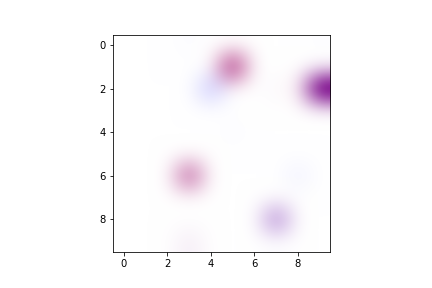

Epoka: 1


<IPython.core.display.Javascript object>


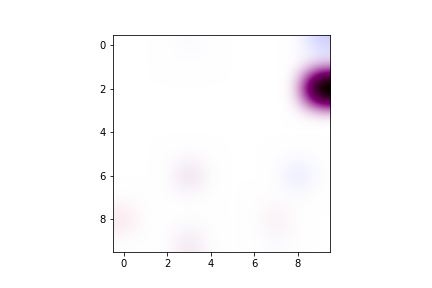

Epoka: 2


<IPython.core.display.Javascript object>


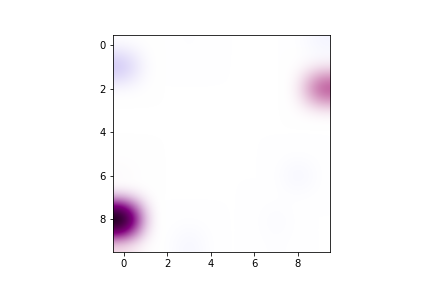

Epoka: 3


<IPython.core.display.Javascript object>


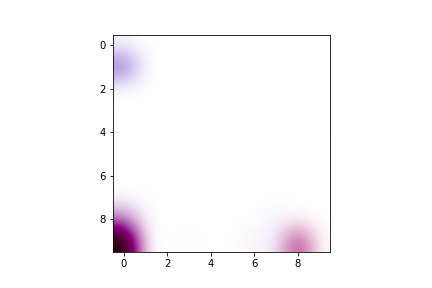

Epoka: 4


<IPython.core.display.Javascript object>


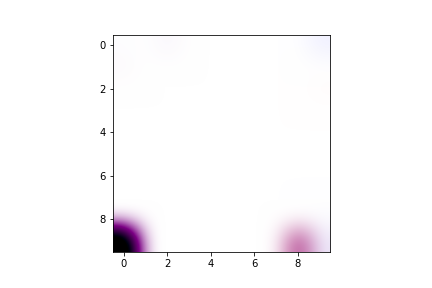

TypeError: 'NoneType' object is not callable

Exception ignored in: 'cupy.cuda.memory.PooledMemory.__dealloc__'
Traceback (most recent call last):
  File "cupy/cuda/memory.pyx", line 518, in cupy.cuda.memory.PooledMemory.free
TypeError: 'NoneType' object is not callable


Epoka: 5


<IPython.core.display.Javascript object>


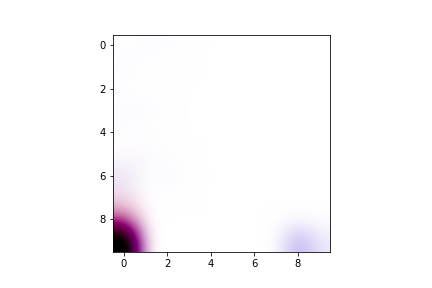

Epoka: 6


<IPython.core.display.Javascript object>


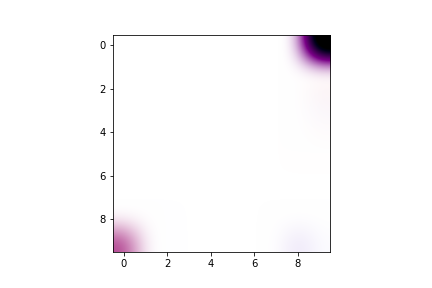

Epoka: 7


<IPython.core.display.Javascript object>


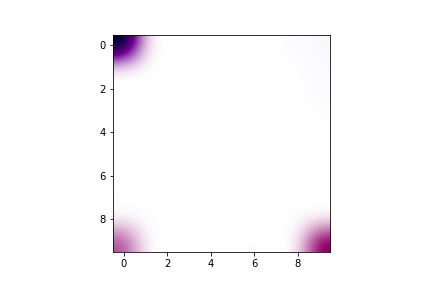

Epoka: 8


<IPython.core.display.Javascript object>


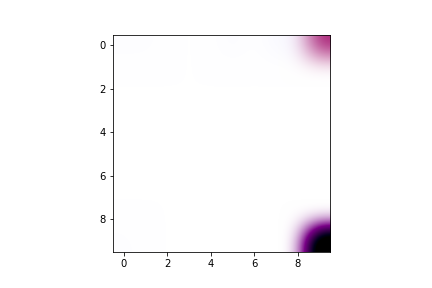

Epoka: 9


<IPython.core.display.Javascript object>


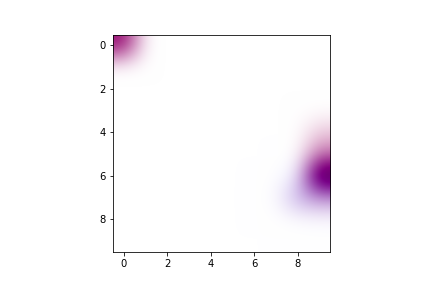

Epoka: 10


<IPython.core.display.Javascript object>


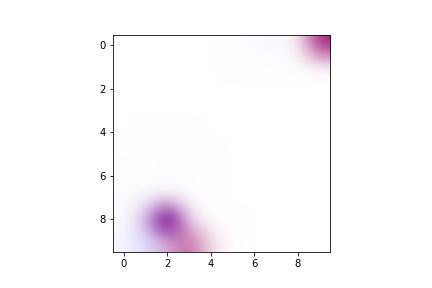

Epoka: 11


<IPython.core.display.Javascript object>


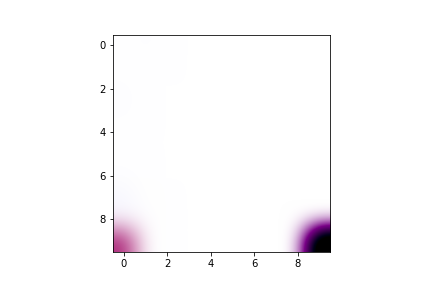

Epoka: 12


<IPython.core.display.Javascript object>


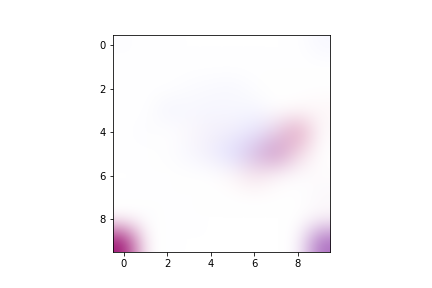

Epoka: 13


<IPython.core.display.Javascript object>


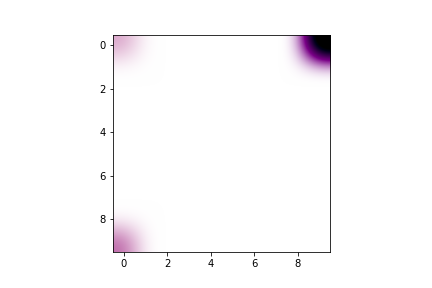

Epoka: 14


<IPython.core.display.Javascript object>


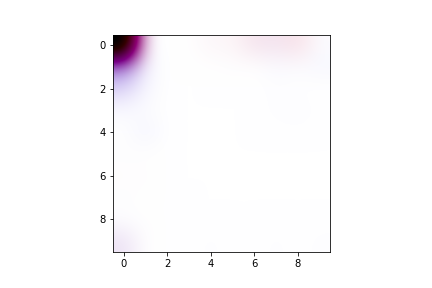

Epoka: 15


<IPython.core.display.Javascript object>


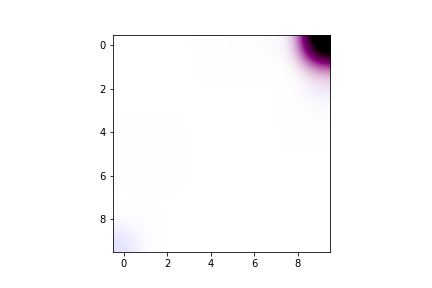

Epoka: 16


<IPython.core.display.Javascript object>


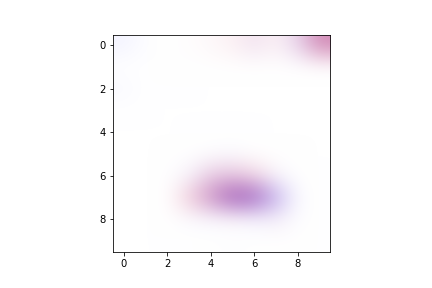

Epoka: 17


<IPython.core.display.Javascript object>


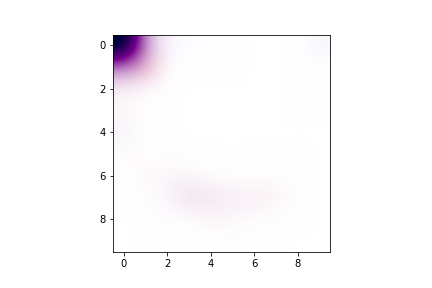

Epoka: 18


<IPython.core.display.Javascript object>


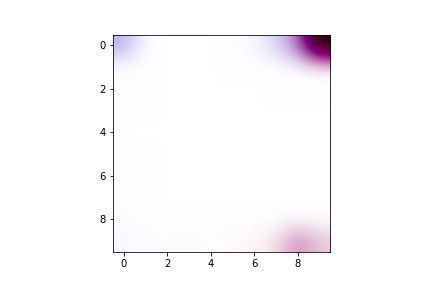

Epoka: 19


<IPython.core.display.Javascript object>


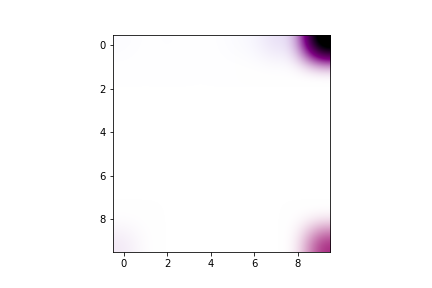

Epoka: 20


e:\aplikacje\aplikacje\programowanie\python\352\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


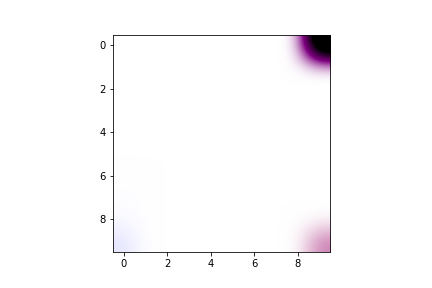

Epoka: 21


<IPython.core.display.Javascript object>


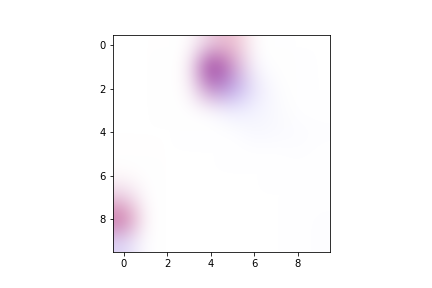

Epoka: 22


<IPython.core.display.Javascript object>


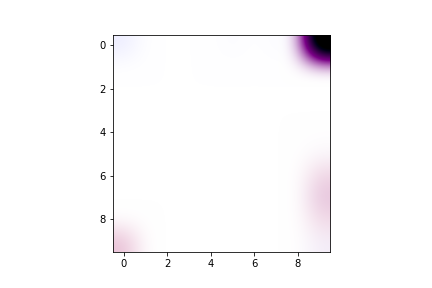

Epoka: 23


<IPython.core.display.Javascript object>


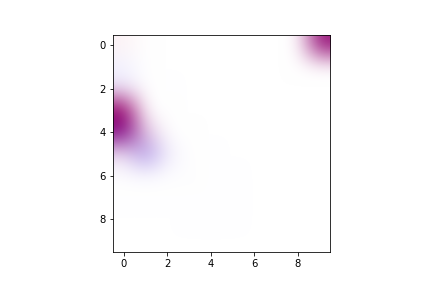

Epoka: 24


<IPython.core.display.Javascript object>


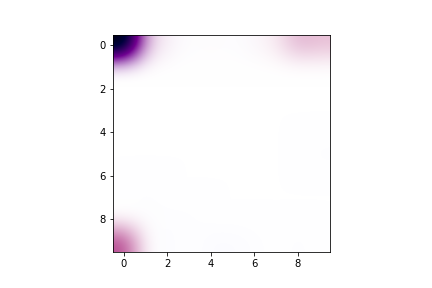

Epoka: 25


<IPython.core.display.Javascript object>


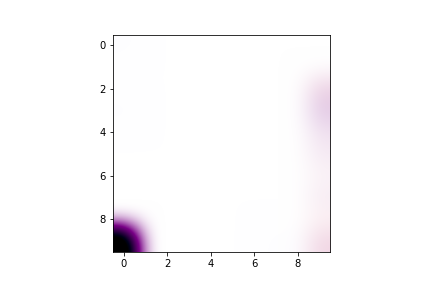

Epoka: 26


<IPython.core.display.Javascript object>


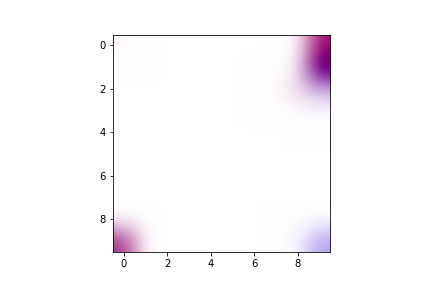

Epoka: 27


<IPython.core.display.Javascript object>


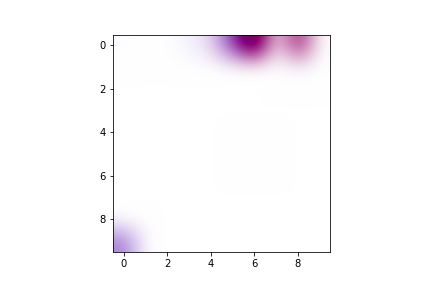

Epoka: 28


<IPython.core.display.Javascript object>


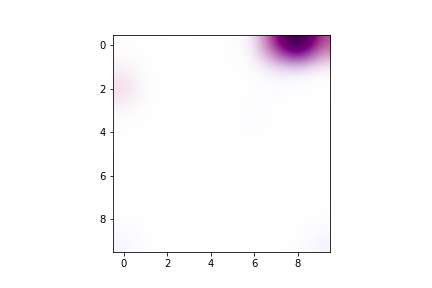

Epoka: 29


<IPython.core.display.Javascript object>


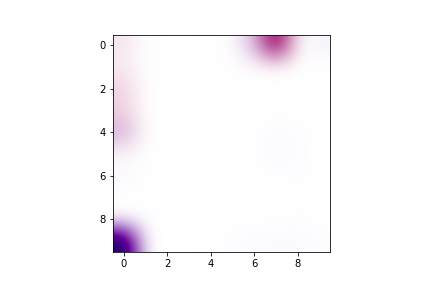

Epoka: 30


<IPython.core.display.Javascript object>


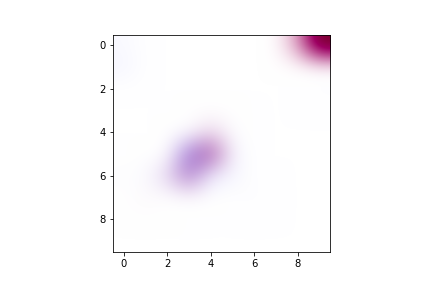

Epoka: 31


<IPython.core.display.Javascript object>


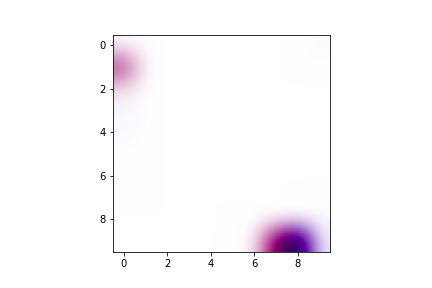

Epoka: 32


<IPython.core.display.Javascript object>


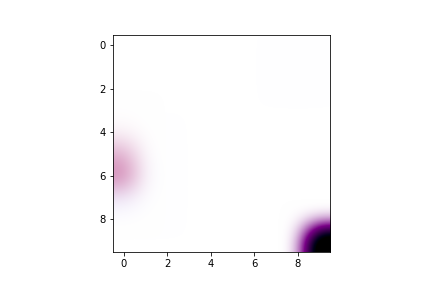

Epoka: 33


<IPython.core.display.Javascript object>


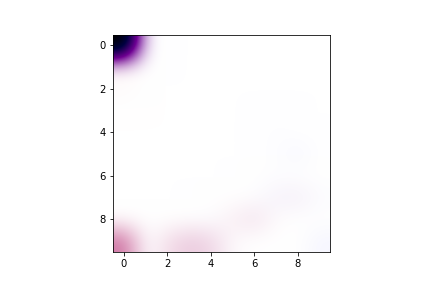

Epoka: 34


<IPython.core.display.Javascript object>


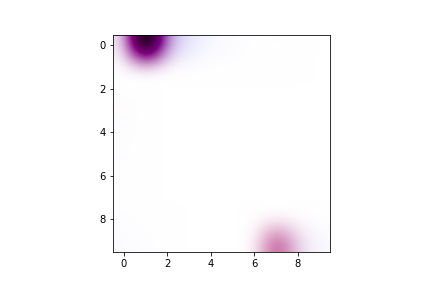

Epoka: 35


<IPython.core.display.Javascript object>


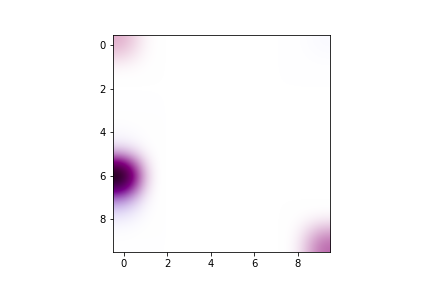

Epoka: 36


<IPython.core.display.Javascript object>


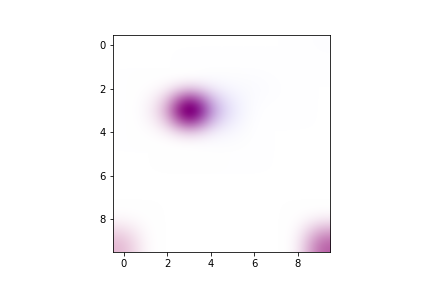

Epoka: 37


<IPython.core.display.Javascript object>


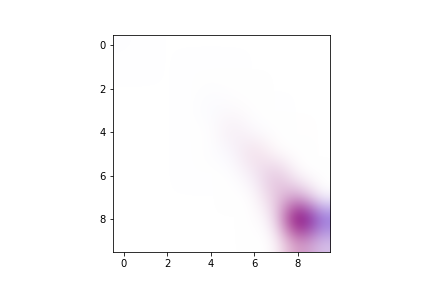

Epoka: 38


<IPython.core.display.Javascript object>


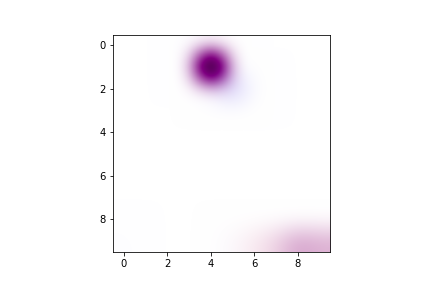

Epoka: 39


<IPython.core.display.Javascript object>


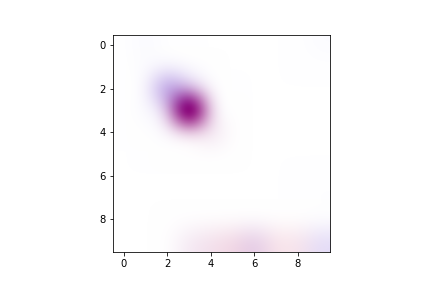

Epoka: 40


<IPython.core.display.Javascript object>


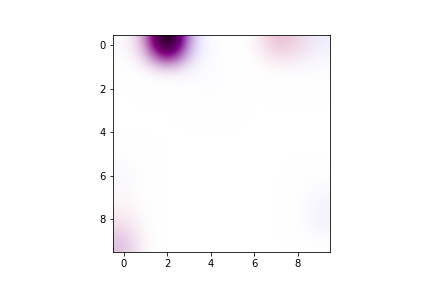

Epoka: 41


<IPython.core.display.Javascript object>


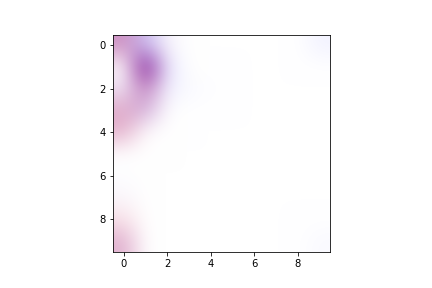

Epoka: 42


<IPython.core.display.Javascript object>


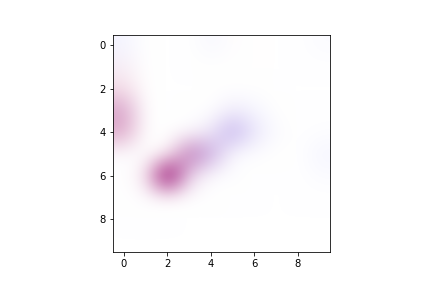

Epoka: 43


<IPython.core.display.Javascript object>


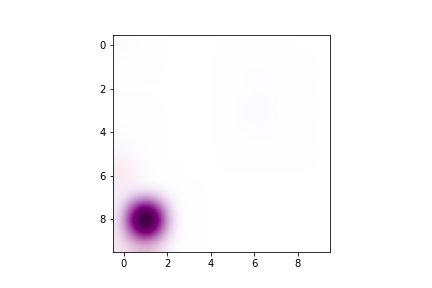

Epoka: 44


<IPython.core.display.Javascript object>


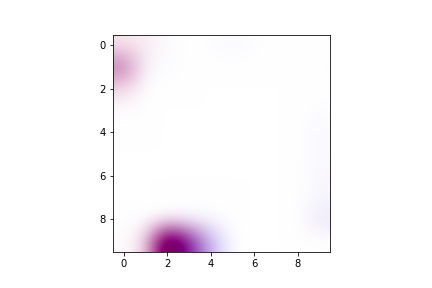

Epoka: 45


<IPython.core.display.Javascript object>


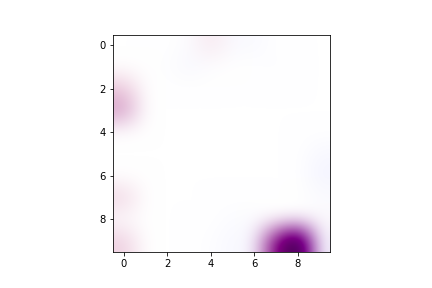

Epoka: 46


<IPython.core.display.Javascript object>


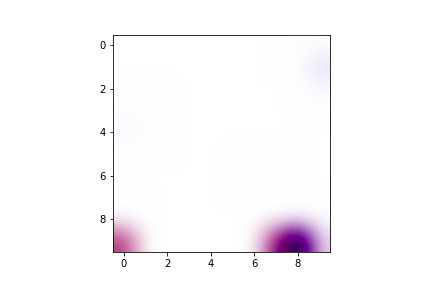

Epoka: 47


<IPython.core.display.Javascript object>


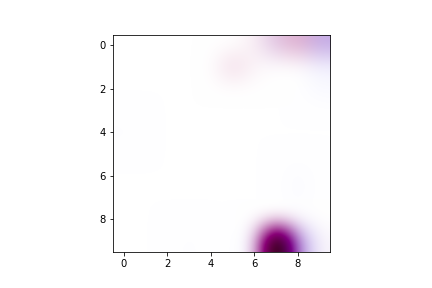

Epoka: 48


<IPython.core.display.Javascript object>


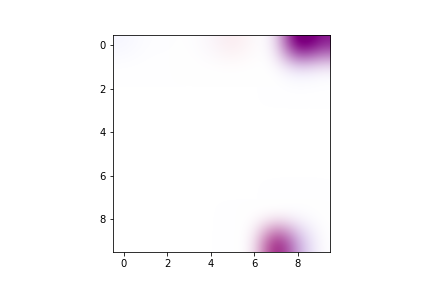

Epoka: 49


<IPython.core.display.Javascript object>


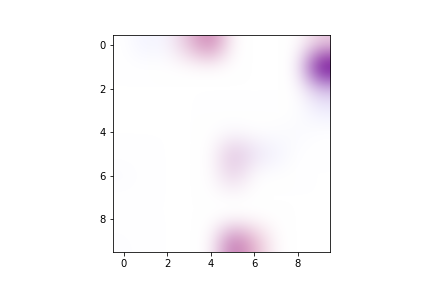

Epoka: 50


<IPython.core.display.Javascript object>


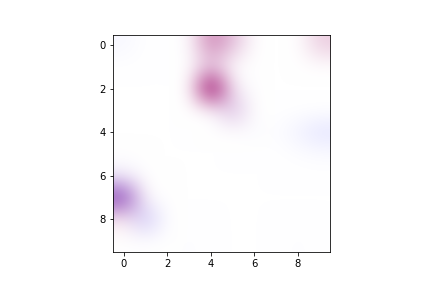

Epoka: 51


<IPython.core.display.Javascript object>


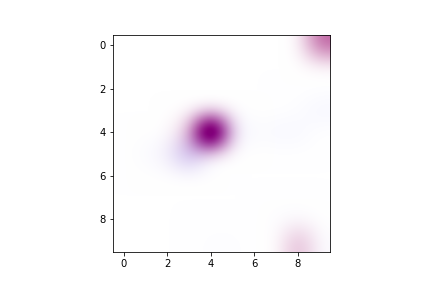

Epoka: 52


<IPython.core.display.Javascript object>


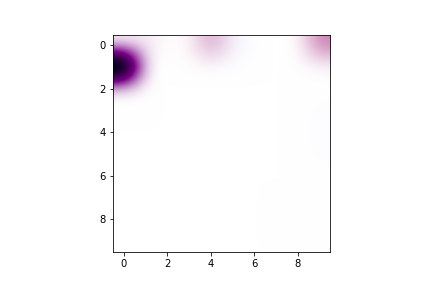

Epoka: 53


<IPython.core.display.Javascript object>


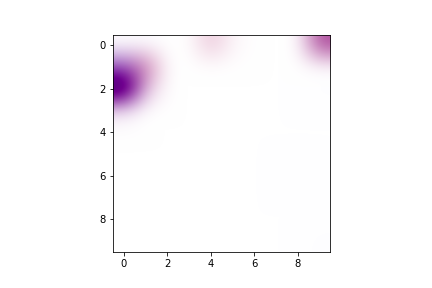

Epoka: 54


<IPython.core.display.Javascript object>


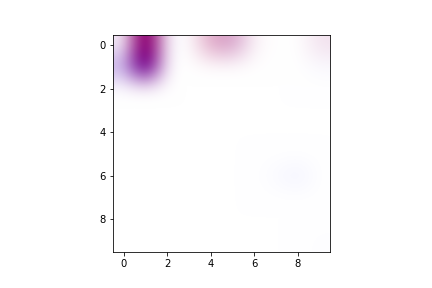

Epoka: 55


<IPython.core.display.Javascript object>


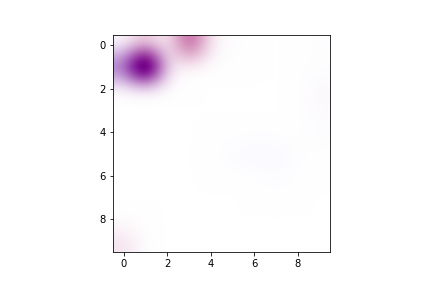

Epoka: 56


<IPython.core.display.Javascript object>


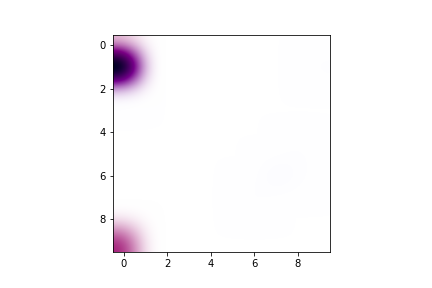

Epoka: 57


<IPython.core.display.Javascript object>


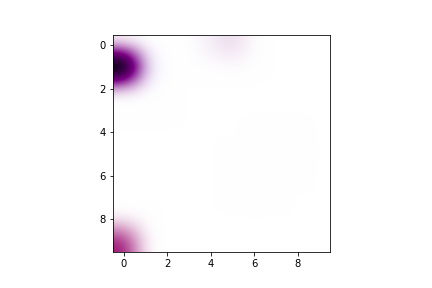

Epoka: 58


<IPython.core.display.Javascript object>


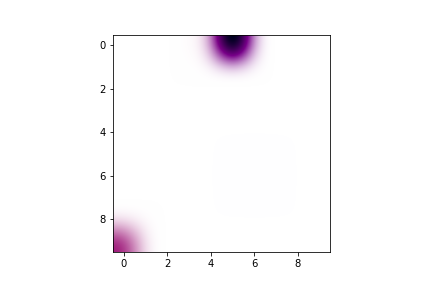

Epoka: 59


<IPython.core.display.Javascript object>


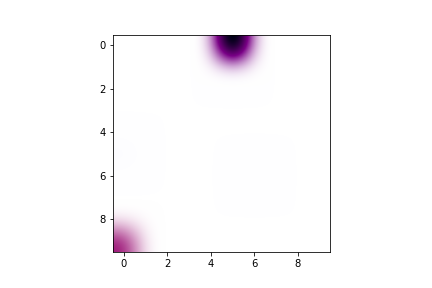

Epoka: 60


<IPython.core.display.Javascript object>


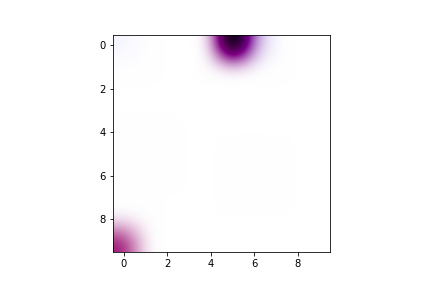

Epoka: 61


<IPython.core.display.Javascript object>


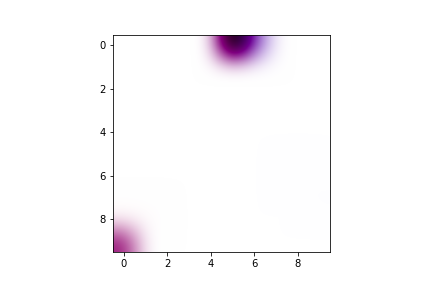

Epoka: 62


<IPython.core.display.Javascript object>


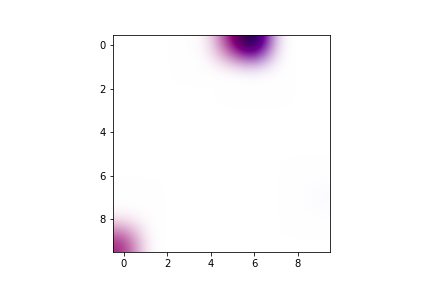

Epoka: 63


<IPython.core.display.Javascript object>


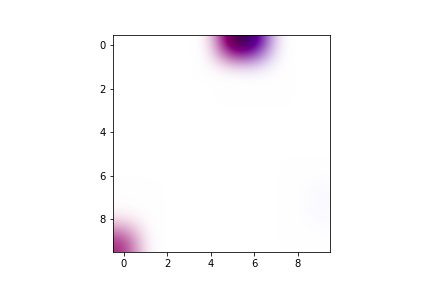

Epoka: 64


<IPython.core.display.Javascript object>


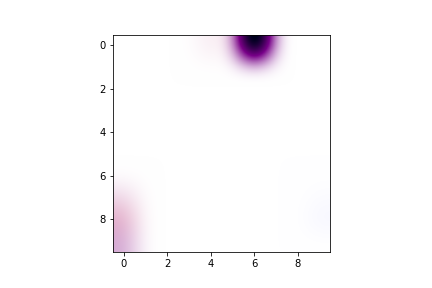

Epoka: 65


<IPython.core.display.Javascript object>


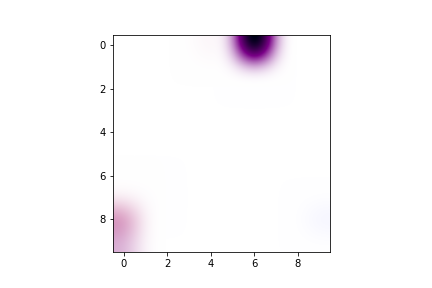

Epoka: 66


<IPython.core.display.Javascript object>


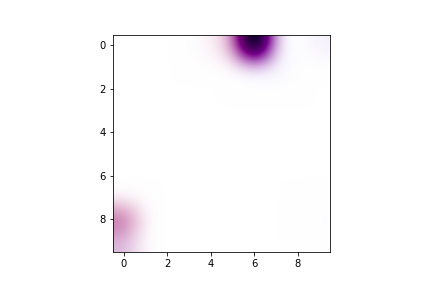

Epoka: 67


<IPython.core.display.Javascript object>


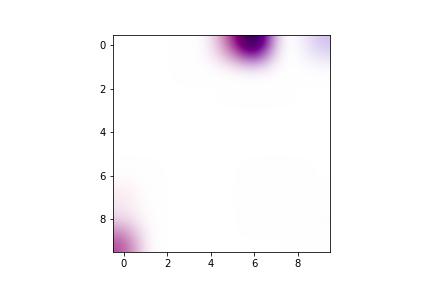

Epoka: 68


<IPython.core.display.Javascript object>


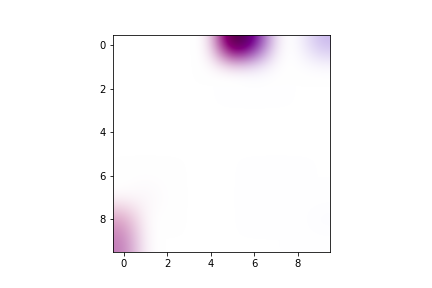

Epoka: 69


<IPython.core.display.Javascript object>


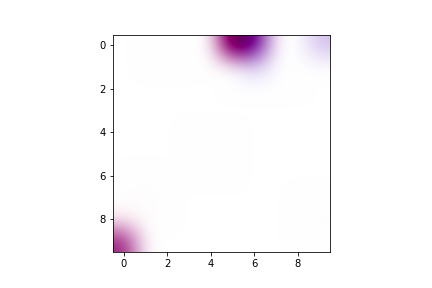

Epoka: 70


<IPython.core.display.Javascript object>


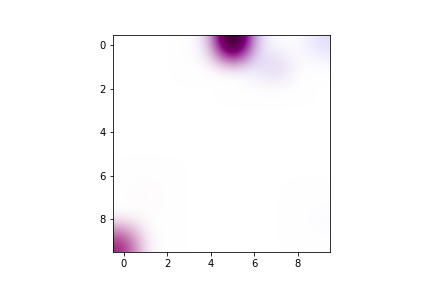

Epoka: 71


<IPython.core.display.Javascript object>


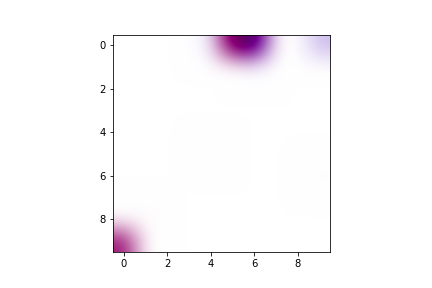

Epoka: 72


<IPython.core.display.Javascript object>


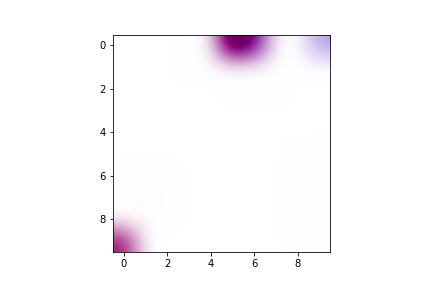

Epoka: 73


<IPython.core.display.Javascript object>


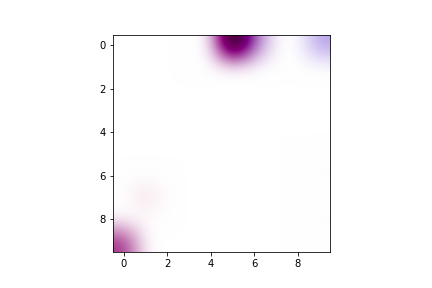

Epoka: 74


<IPython.core.display.Javascript object>


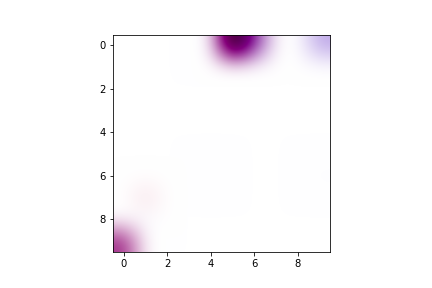

Epoka: 75


<IPython.core.display.Javascript object>


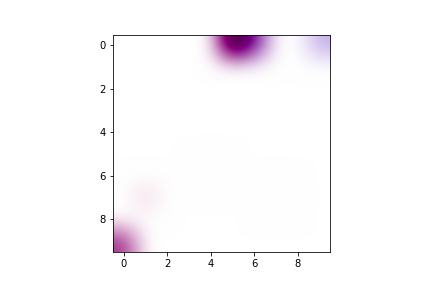

Epoka: 76


<IPython.core.display.Javascript object>


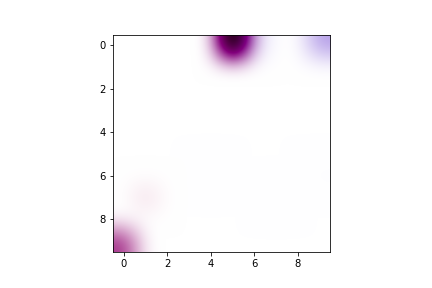

Epoka: 77


<IPython.core.display.Javascript object>


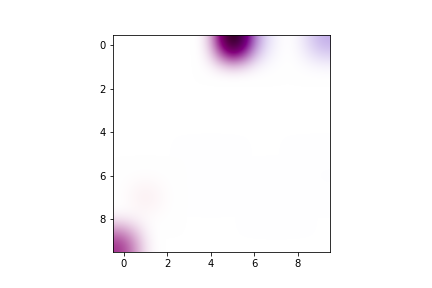

Epoka: 78


<IPython.core.display.Javascript object>


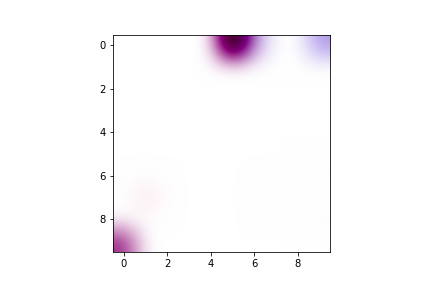

Epoka: 79


<IPython.core.display.Javascript object>


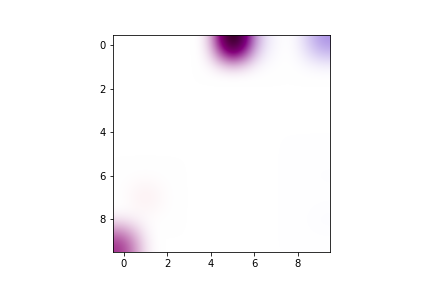

Epoka: 80


<IPython.core.display.Javascript object>


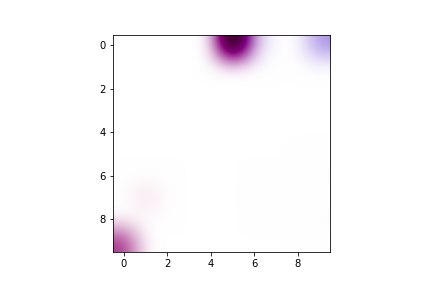

Epoka: 81


<IPython.core.display.Javascript object>


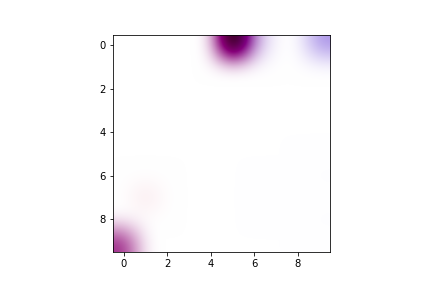

Epoka: 82


<IPython.core.display.Javascript object>


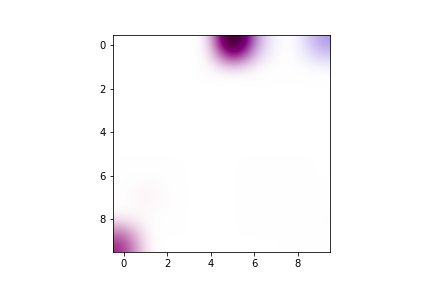

Epoka: 83


<IPython.core.display.Javascript object>


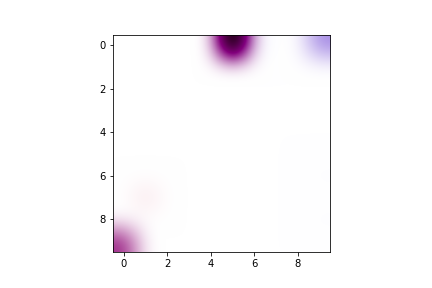

Epoka: 84


<IPython.core.display.Javascript object>


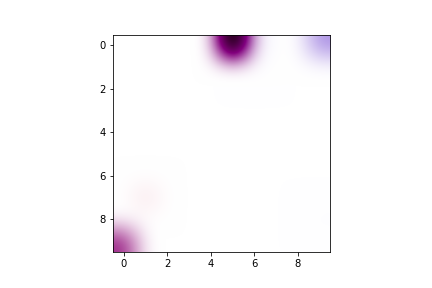

Epoka: 85


<IPython.core.display.Javascript object>


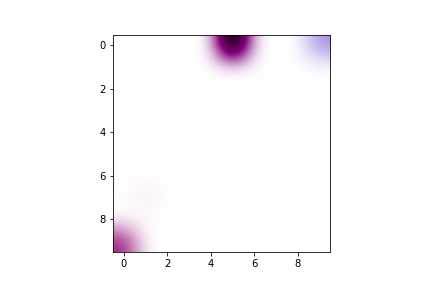

Epoka: 86


<IPython.core.display.Javascript object>


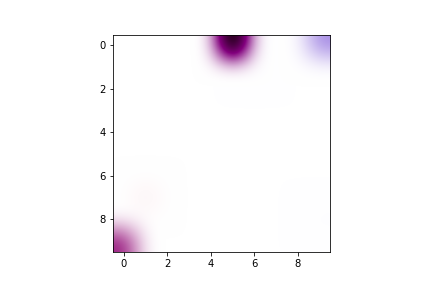

Epoka: 87


<IPython.core.display.Javascript object>


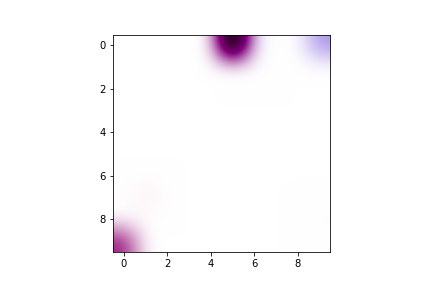

Epoka: 88


<IPython.core.display.Javascript object>


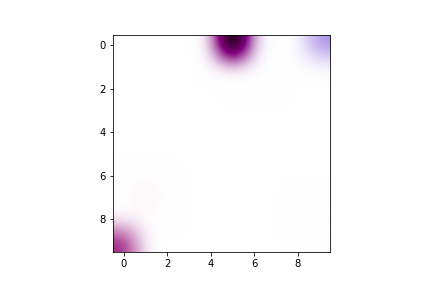

Epoka: 89


<IPython.core.display.Javascript object>


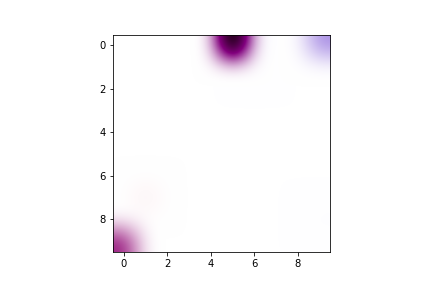

Epoka: 90


<IPython.core.display.Javascript object>


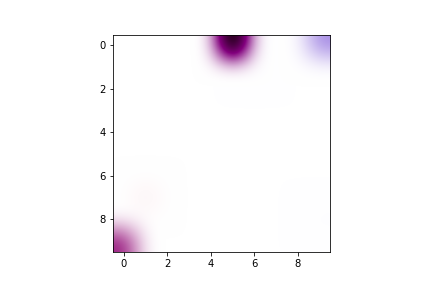

Epoka: 91


<IPython.core.display.Javascript object>


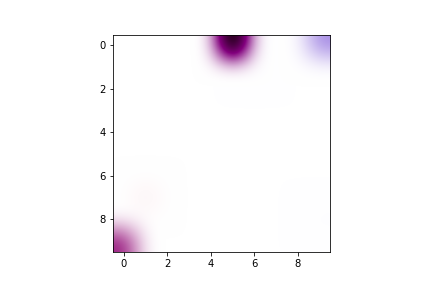

Epoka: 92


<IPython.core.display.Javascript object>


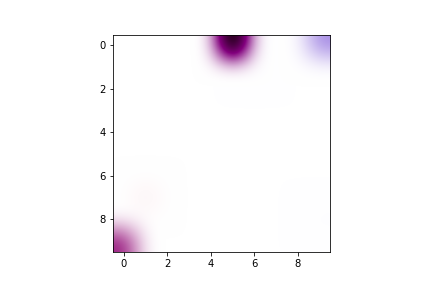

Epoka: 93


<IPython.core.display.Javascript object>


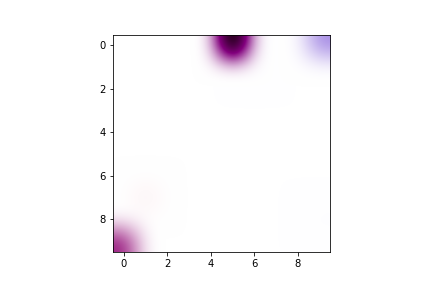

Epoka: 94


<IPython.core.display.Javascript object>


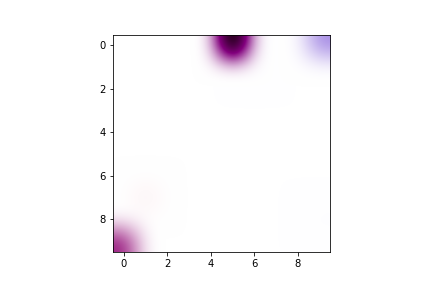

Epoka: 95


<IPython.core.display.Javascript object>


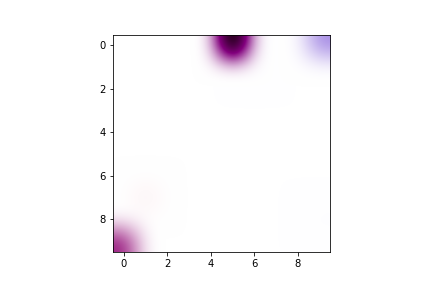

Epoka: 96


<IPython.core.display.Javascript object>


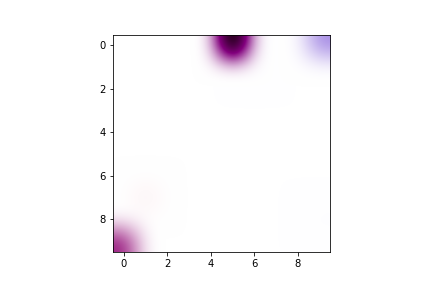

Epoka: 97


<IPython.core.display.Javascript object>


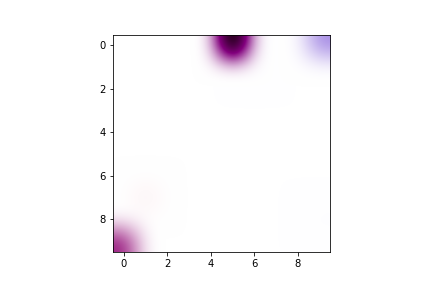

Epoka: 98


<IPython.core.display.Javascript object>


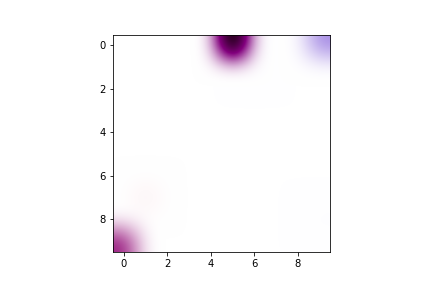

Epoka: 99


<IPython.core.display.Javascript object>


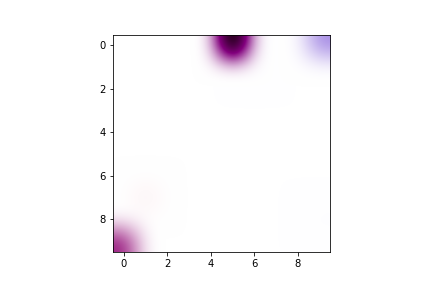

Epoka: 100


<IPython.core.display.Javascript object>


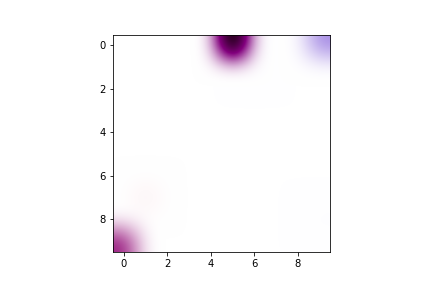

In [35]:
maps_for_return_networks(ret_network_100_100_1_a005_d10)

Epoka: 0


<IPython.core.display.Javascript object>


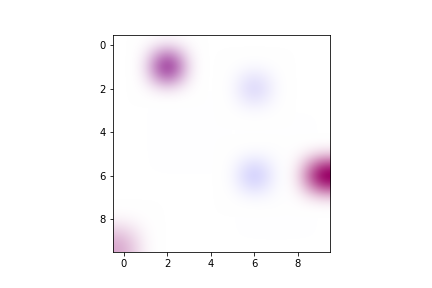

Epoka: 1


<IPython.core.display.Javascript object>


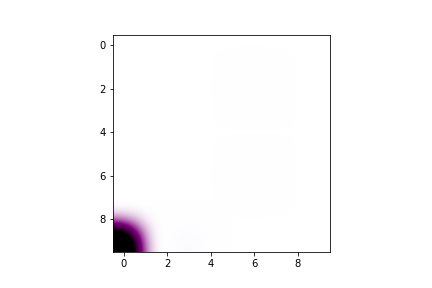

Epoka: 2


<IPython.core.display.Javascript object>


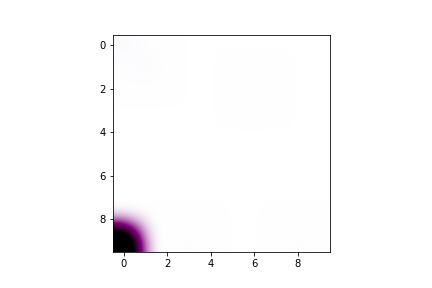

Epoka: 3


<IPython.core.display.Javascript object>


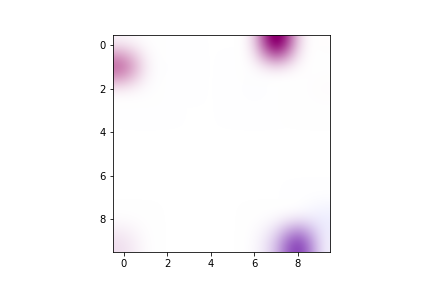

Epoka: 4


<IPython.core.display.Javascript object>


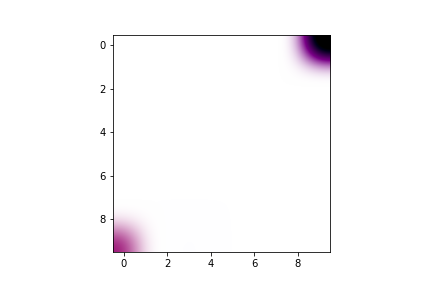

Epoka: 5


<IPython.core.display.Javascript object>


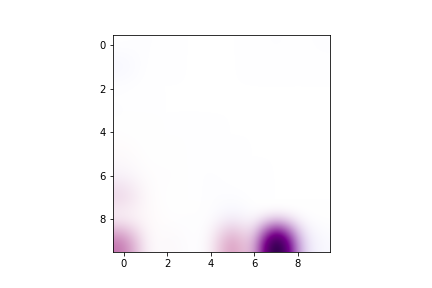

Epoka: 6


<IPython.core.display.Javascript object>


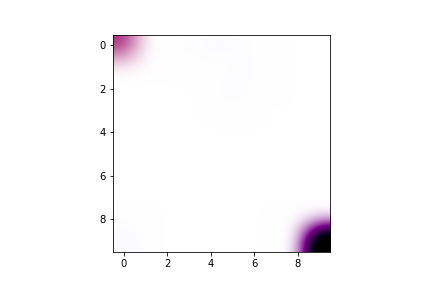

Epoka: 7


<IPython.core.display.Javascript object>


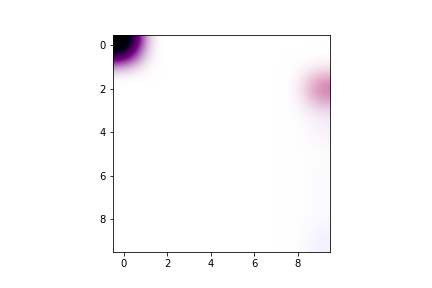

Epoka: 8


<IPython.core.display.Javascript object>


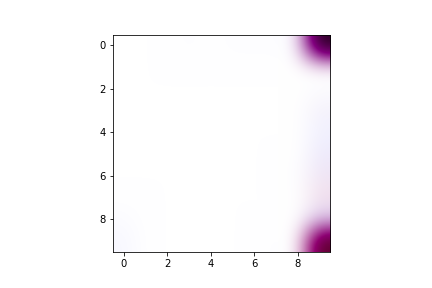

Epoka: 9


<IPython.core.display.Javascript object>


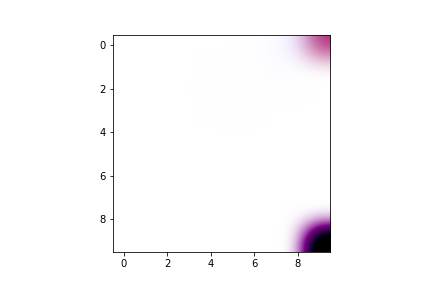

Epoka: 10


<IPython.core.display.Javascript object>


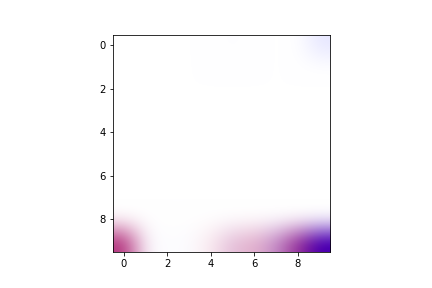

Epoka: 11


<IPython.core.display.Javascript object>


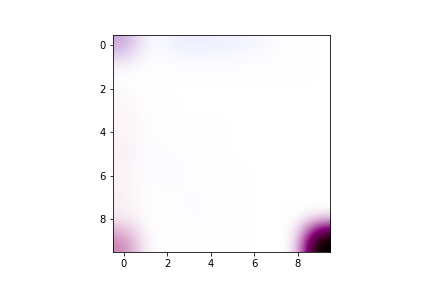

Epoka: 12


<IPython.core.display.Javascript object>


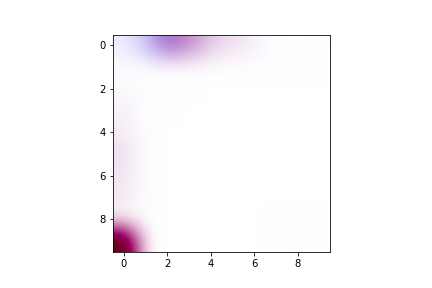

Epoka: 13


<IPython.core.display.Javascript object>


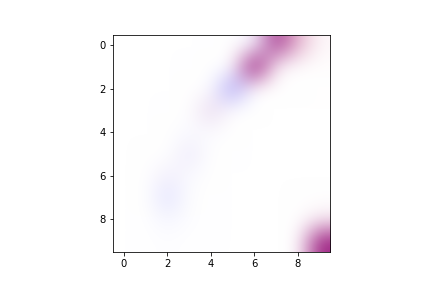

Epoka: 14


<IPython.core.display.Javascript object>


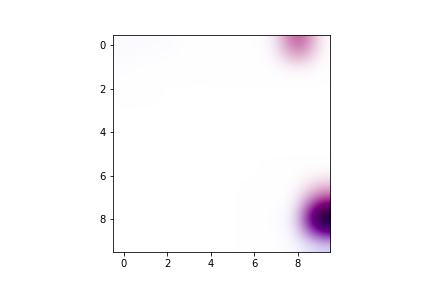

Epoka: 15


<IPython.core.display.Javascript object>


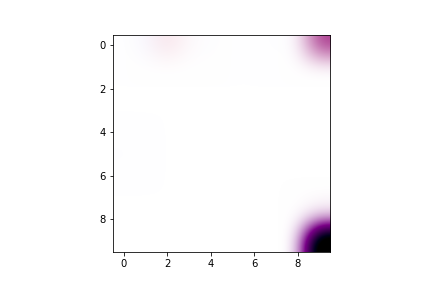

Epoka: 16


<IPython.core.display.Javascript object>


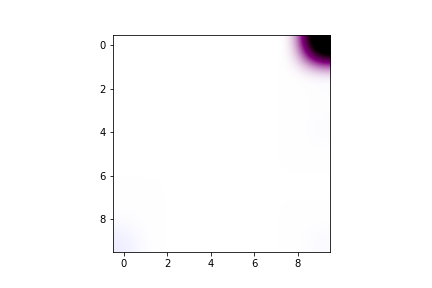

Epoka: 17


<IPython.core.display.Javascript object>


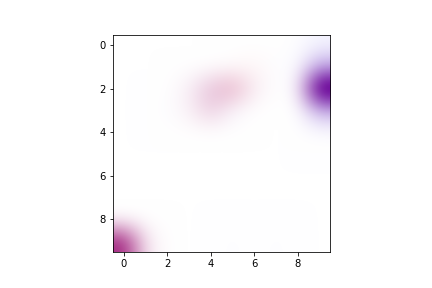

Epoka: 18


<IPython.core.display.Javascript object>


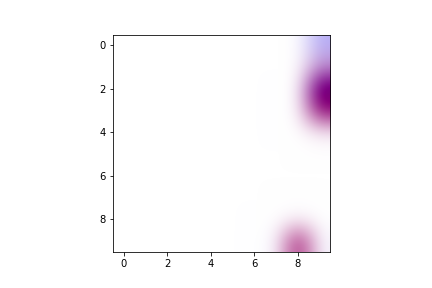

Epoka: 19


<IPython.core.display.Javascript object>


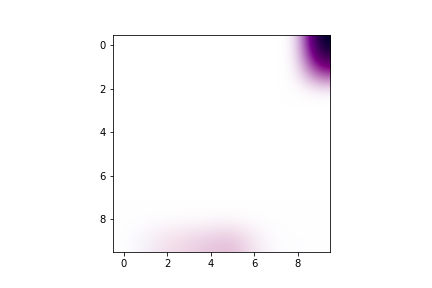

Epoka: 20


e:\aplikacje\aplikacje\programowanie\python\352\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


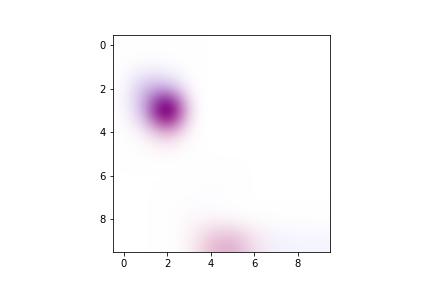

Epoka: 21


<IPython.core.display.Javascript object>


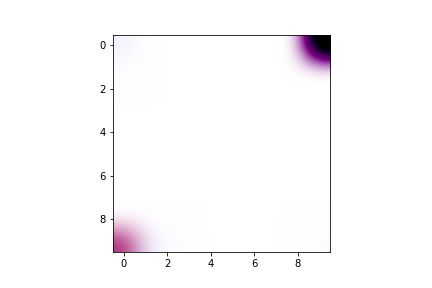

Epoka: 22


<IPython.core.display.Javascript object>


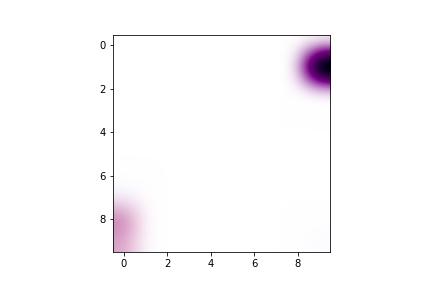

Epoka: 23


<IPython.core.display.Javascript object>


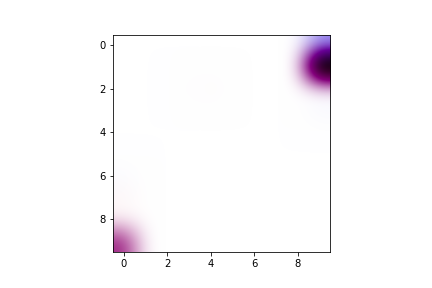

Epoka: 24


<IPython.core.display.Javascript object>


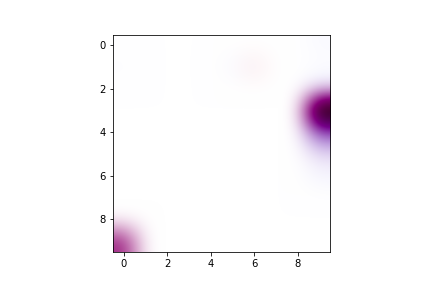

Epoka: 25


<IPython.core.display.Javascript object>


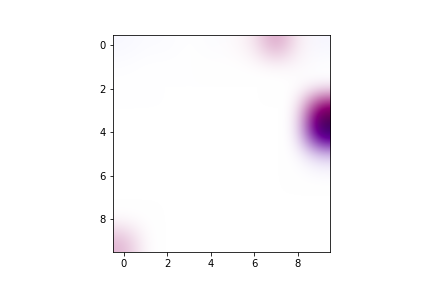

Epoka: 26


<IPython.core.display.Javascript object>


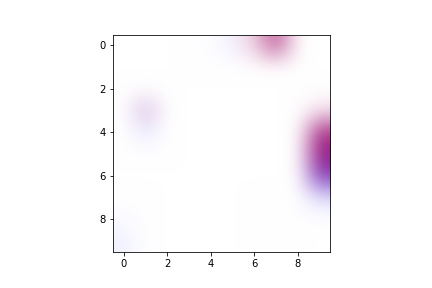

Epoka: 27


<IPython.core.display.Javascript object>


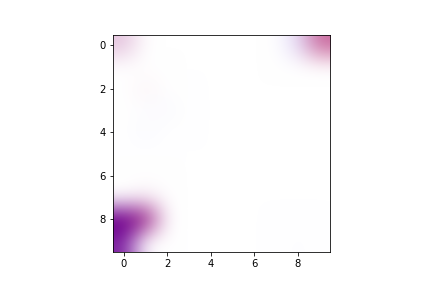

Epoka: 28


<IPython.core.display.Javascript object>


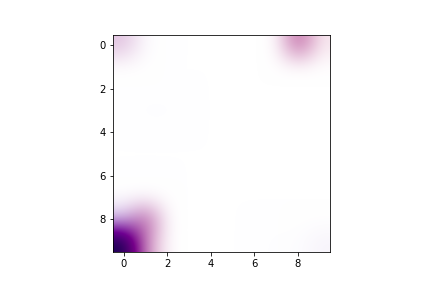

Epoka: 29


<IPython.core.display.Javascript object>


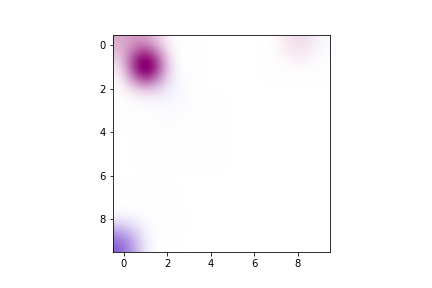

Epoka: 30


<IPython.core.display.Javascript object>


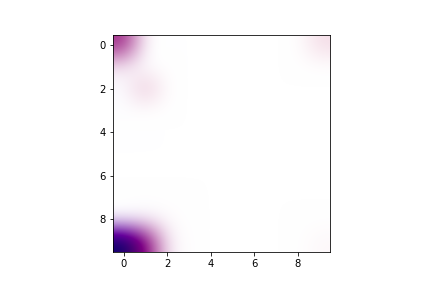

Epoka: 31


<IPython.core.display.Javascript object>


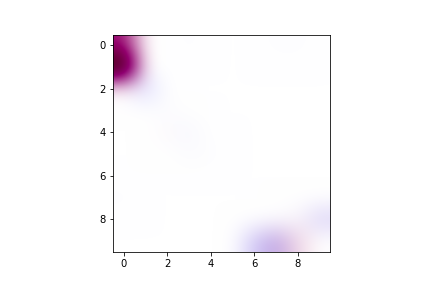

Epoka: 32


<IPython.core.display.Javascript object>


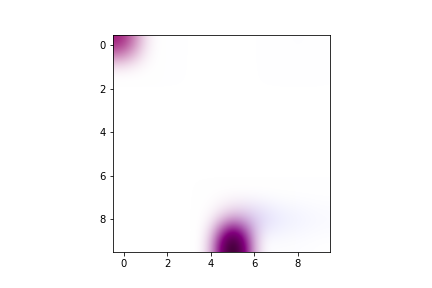

Epoka: 33


<IPython.core.display.Javascript object>


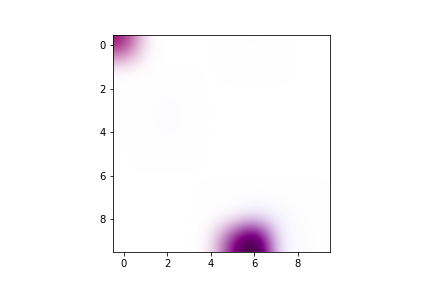

Epoka: 34


<IPython.core.display.Javascript object>


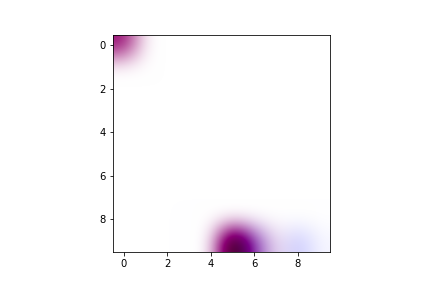

Epoka: 35


<IPython.core.display.Javascript object>


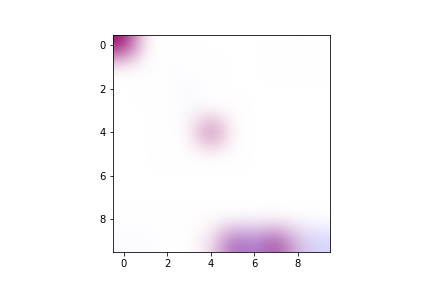

Epoka: 36


<IPython.core.display.Javascript object>


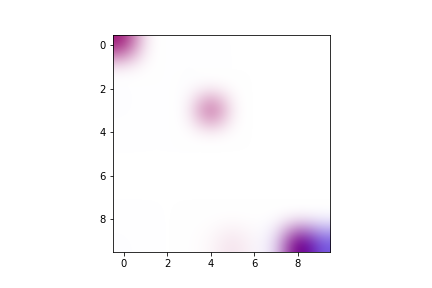

Epoka: 37


<IPython.core.display.Javascript object>


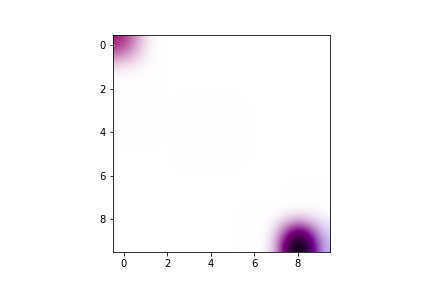

Epoka: 38


<IPython.core.display.Javascript object>


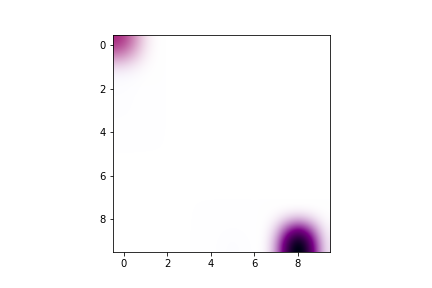

Epoka: 39


<IPython.core.display.Javascript object>


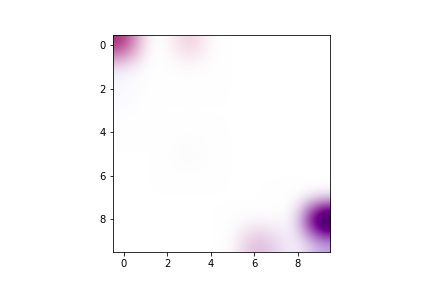

Epoka: 40


<IPython.core.display.Javascript object>


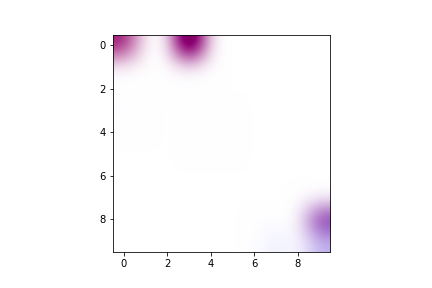

Epoka: 41


<IPython.core.display.Javascript object>


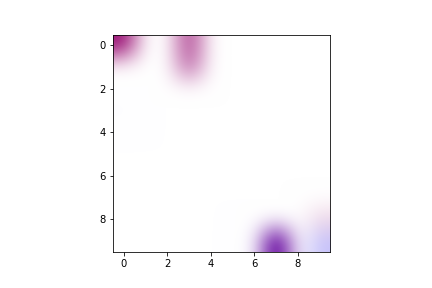

Epoka: 42


<IPython.core.display.Javascript object>


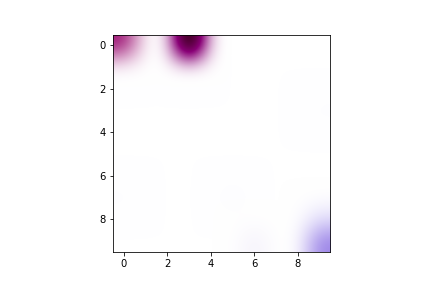

Epoka: 43


<IPython.core.display.Javascript object>


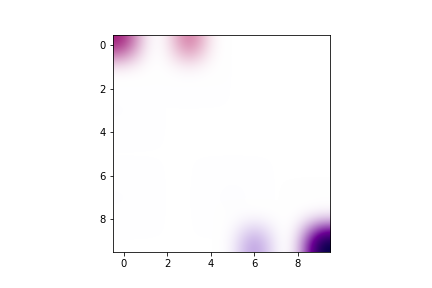

Epoka: 44


<IPython.core.display.Javascript object>


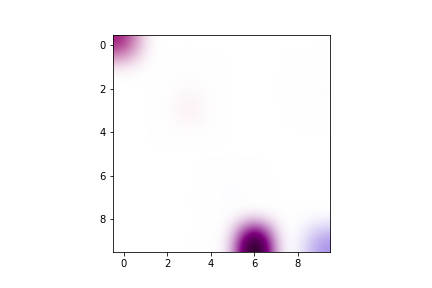

Epoka: 45


<IPython.core.display.Javascript object>


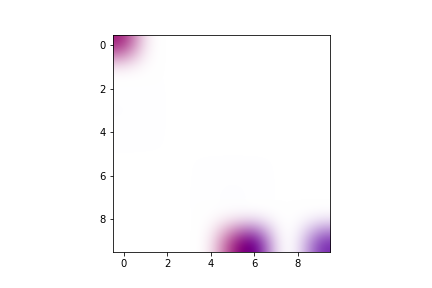

Epoka: 46


<IPython.core.display.Javascript object>


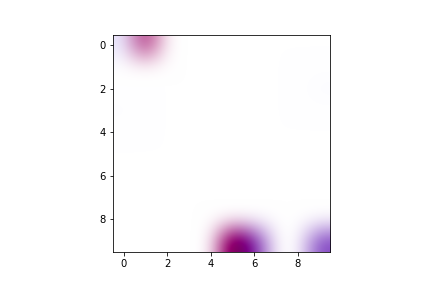

Epoka: 47


<IPython.core.display.Javascript object>


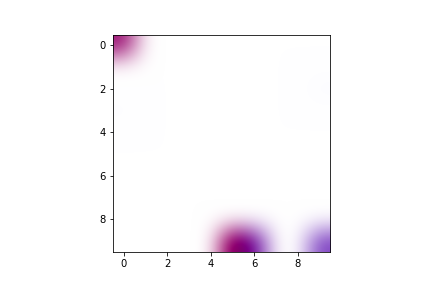

Epoka: 48


<IPython.core.display.Javascript object>


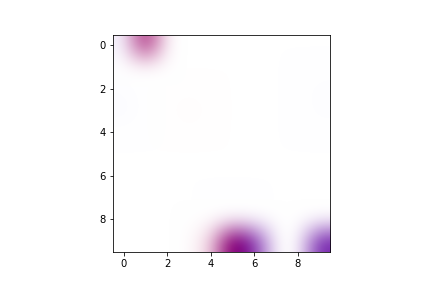

Epoka: 49


<IPython.core.display.Javascript object>


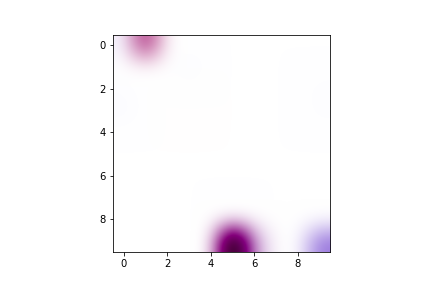

Epoka: 50


<IPython.core.display.Javascript object>


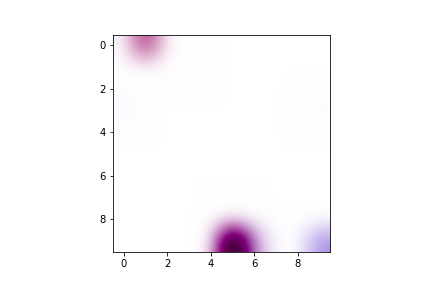

Epoka: 51


<IPython.core.display.Javascript object>


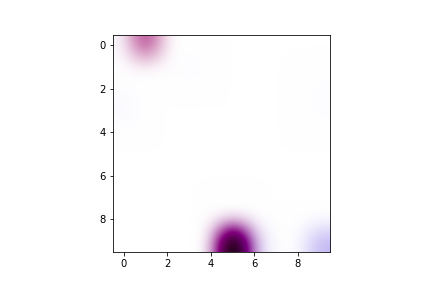

Epoka: 52


<IPython.core.display.Javascript object>


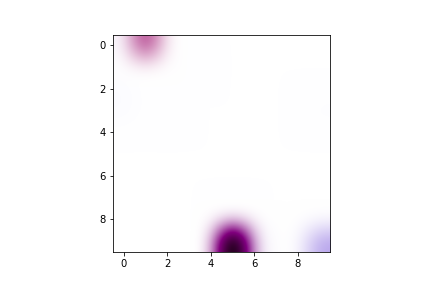

Epoka: 53


<IPython.core.display.Javascript object>


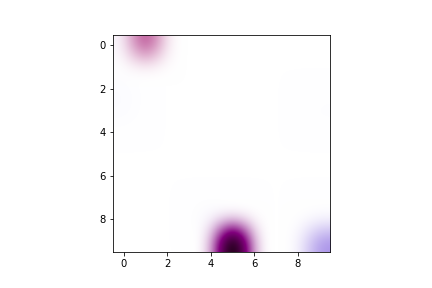

Epoka: 54


<IPython.core.display.Javascript object>


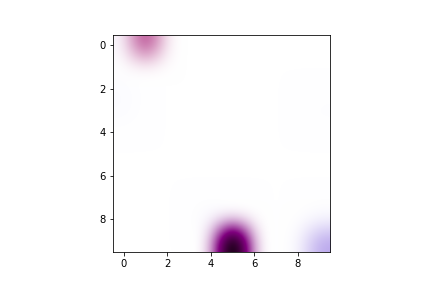

Epoka: 55


<IPython.core.display.Javascript object>


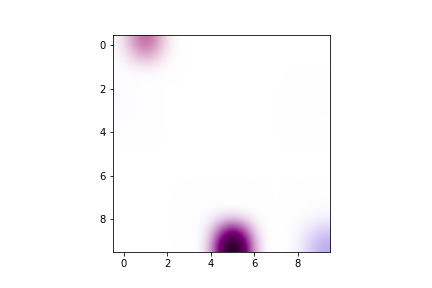

Epoka: 56


<IPython.core.display.Javascript object>


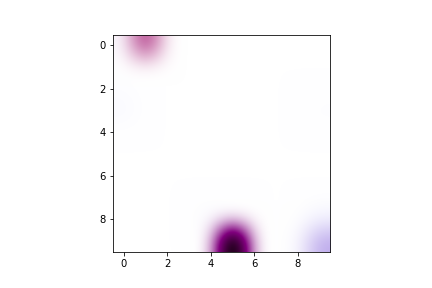

Epoka: 57


<IPython.core.display.Javascript object>


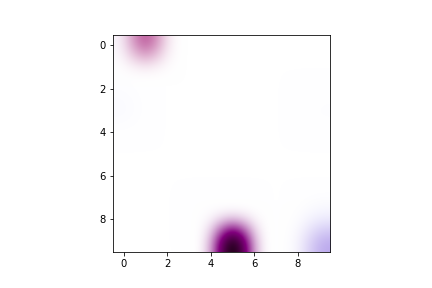

Epoka: 58


<IPython.core.display.Javascript object>


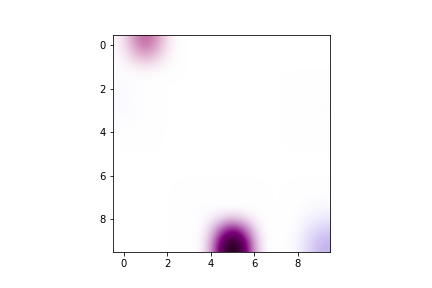

Epoka: 59


<IPython.core.display.Javascript object>


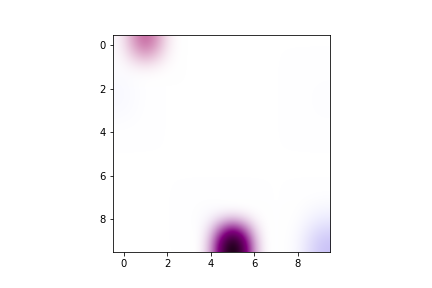

Epoka: 60


<IPython.core.display.Javascript object>


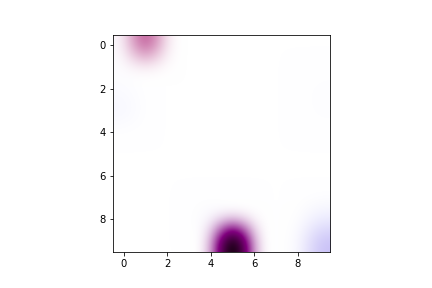

Epoka: 61


<IPython.core.display.Javascript object>


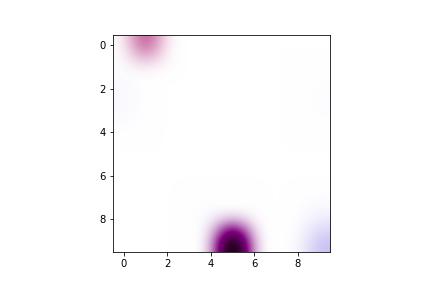

Epoka: 62


<IPython.core.display.Javascript object>


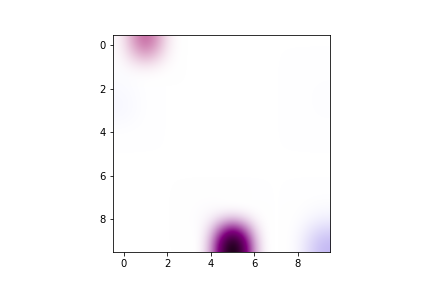

Epoka: 63


<IPython.core.display.Javascript object>


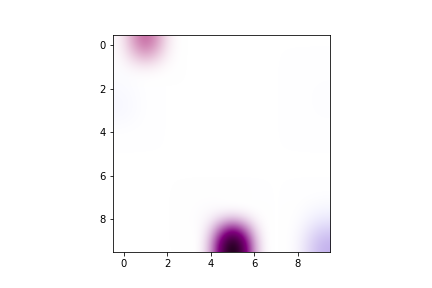

Epoka: 64


<IPython.core.display.Javascript object>


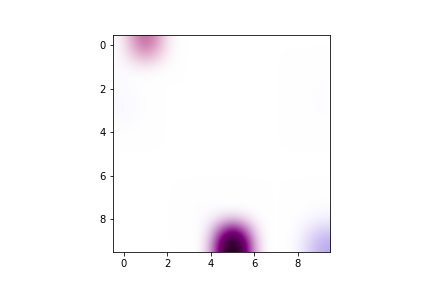

Epoka: 65


<IPython.core.display.Javascript object>


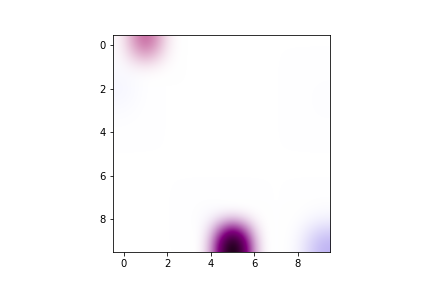

Epoka: 66


<IPython.core.display.Javascript object>


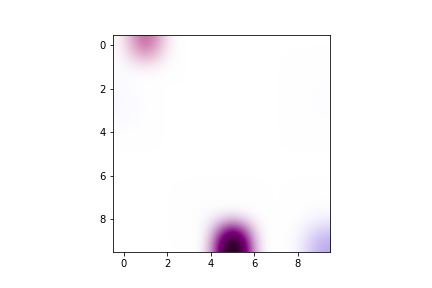

Epoka: 67


<IPython.core.display.Javascript object>


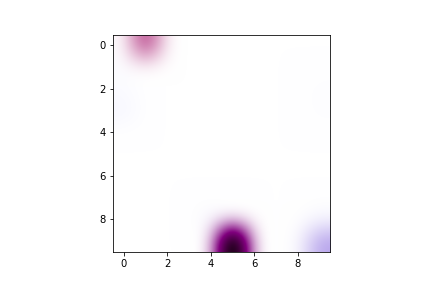

Epoka: 68


<IPython.core.display.Javascript object>


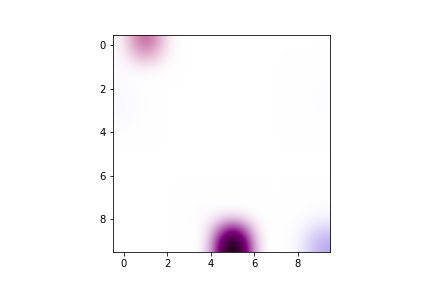

Epoka: 69


<IPython.core.display.Javascript object>


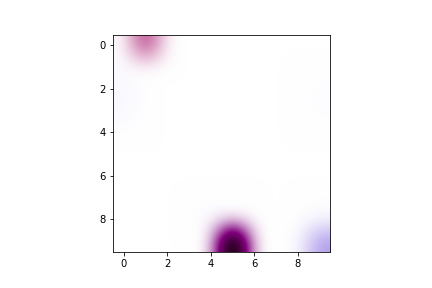

Epoka: 70


<IPython.core.display.Javascript object>


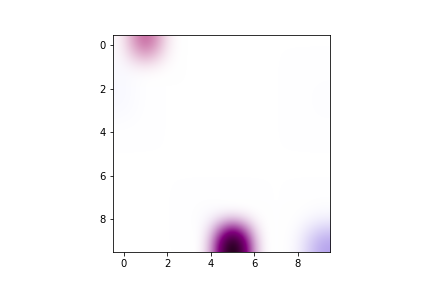

Epoka: 71


<IPython.core.display.Javascript object>


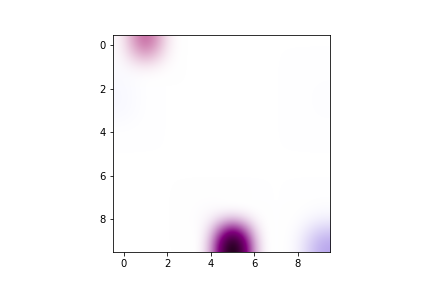

Epoka: 72


<IPython.core.display.Javascript object>


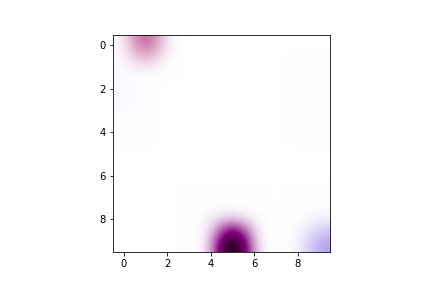

Epoka: 73


<IPython.core.display.Javascript object>


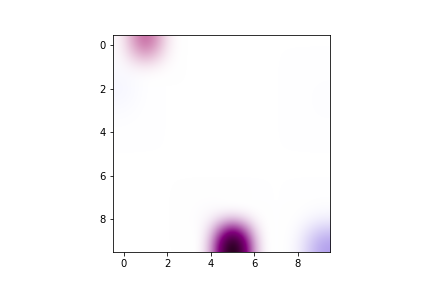

Epoka: 74


<IPython.core.display.Javascript object>


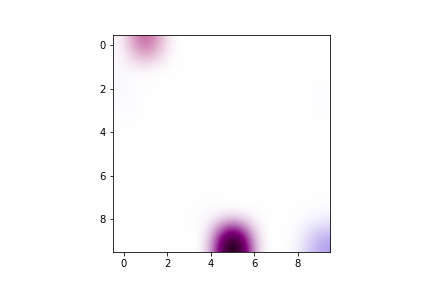

Epoka: 75


<IPython.core.display.Javascript object>


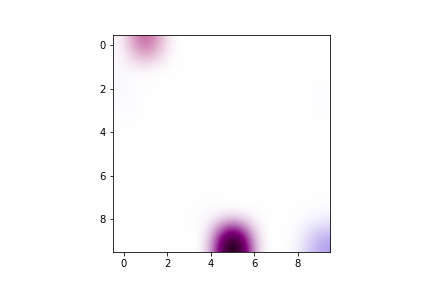

Epoka: 76


<IPython.core.display.Javascript object>


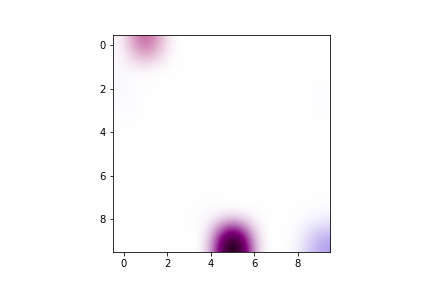

Epoka: 77


<IPython.core.display.Javascript object>


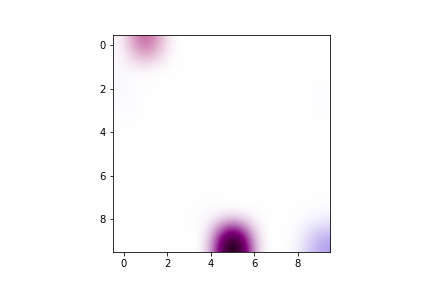

Epoka: 78


<IPython.core.display.Javascript object>


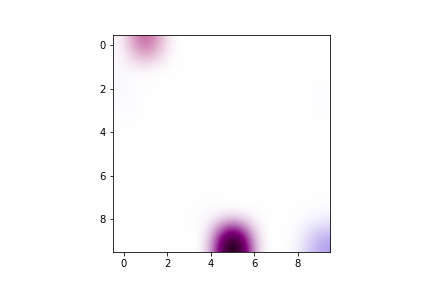

Epoka: 79


<IPython.core.display.Javascript object>


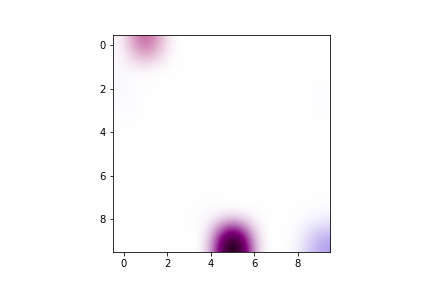

Epoka: 80


<IPython.core.display.Javascript object>


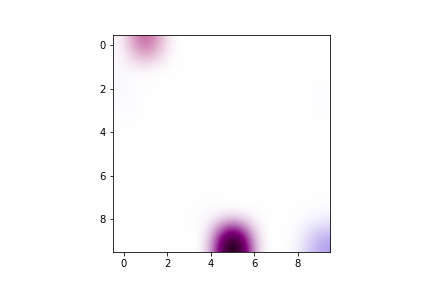

Epoka: 81


<IPython.core.display.Javascript object>


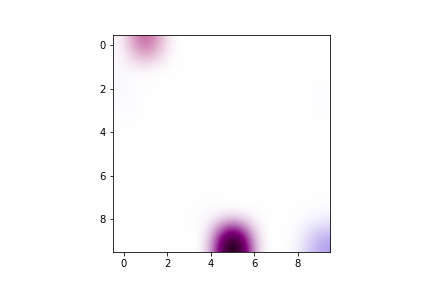

Epoka: 82


<IPython.core.display.Javascript object>


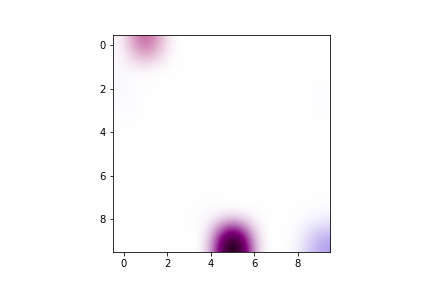

Epoka: 83


<IPython.core.display.Javascript object>


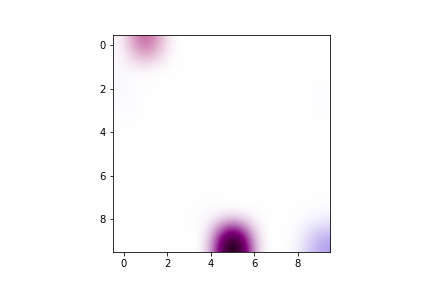

Epoka: 84


<IPython.core.display.Javascript object>


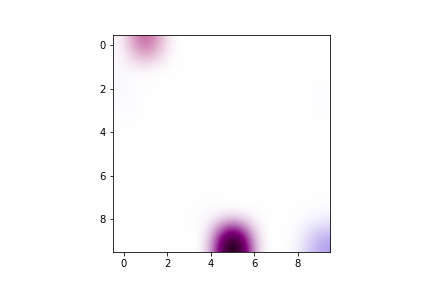

Epoka: 85


<IPython.core.display.Javascript object>


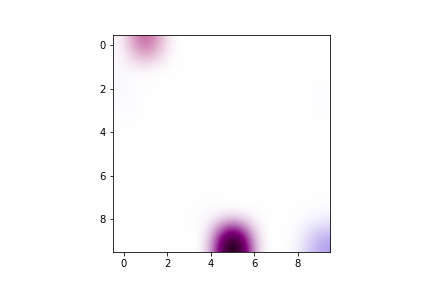

Epoka: 86


<IPython.core.display.Javascript object>


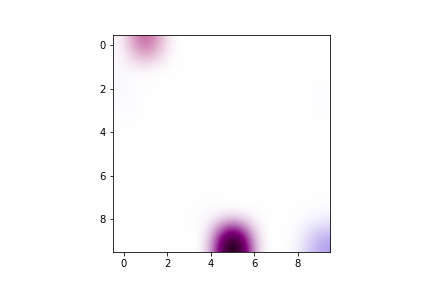

Epoka: 87


<IPython.core.display.Javascript object>


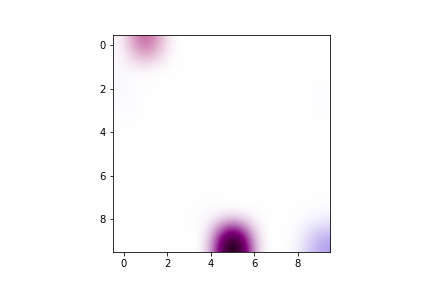

Epoka: 88


<IPython.core.display.Javascript object>


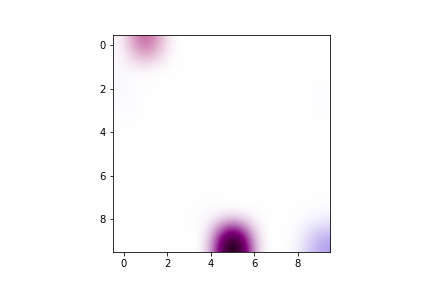

Epoka: 89


<IPython.core.display.Javascript object>


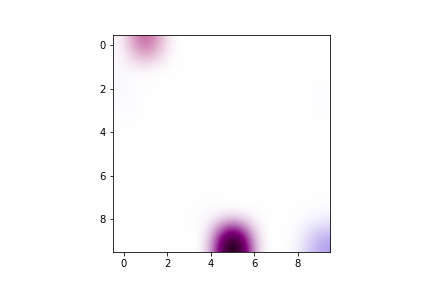

Epoka: 90


<IPython.core.display.Javascript object>


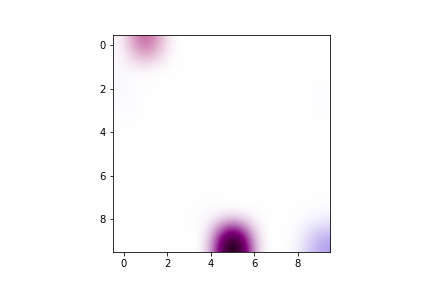

Epoka: 91


<IPython.core.display.Javascript object>


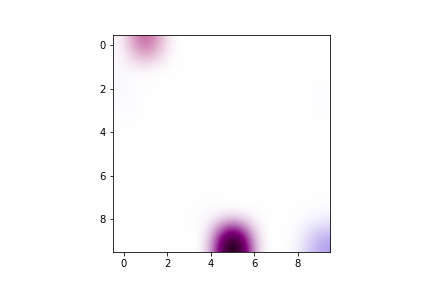

Epoka: 92


<IPython.core.display.Javascript object>


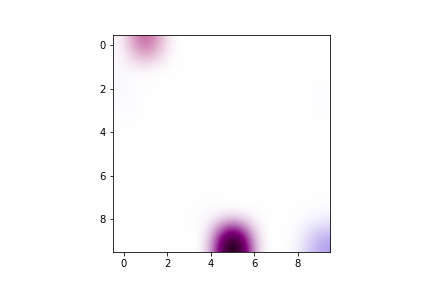

Epoka: 93


<IPython.core.display.Javascript object>


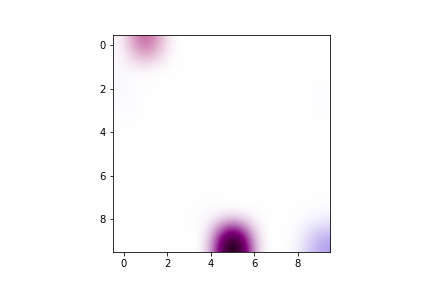

Epoka: 94


<IPython.core.display.Javascript object>


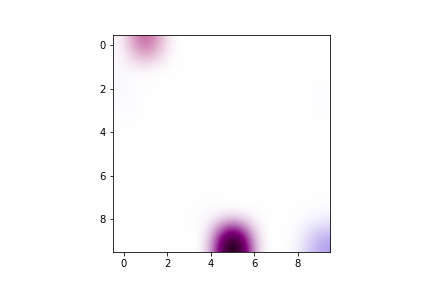

Epoka: 95


<IPython.core.display.Javascript object>


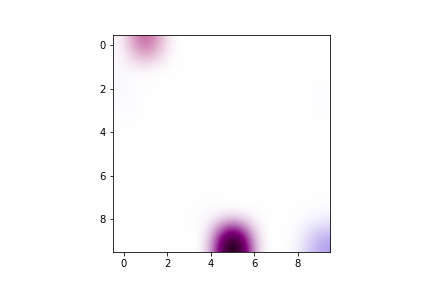

Epoka: 96


<IPython.core.display.Javascript object>


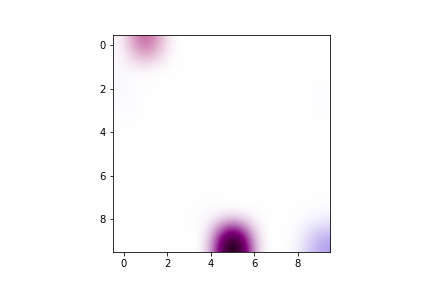

Epoka: 97


<IPython.core.display.Javascript object>


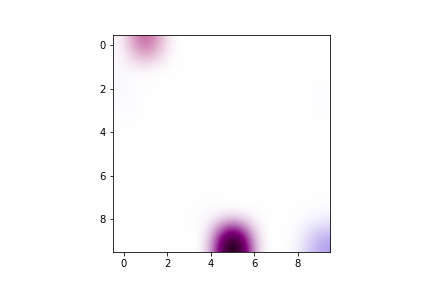

Epoka: 98


<IPython.core.display.Javascript object>


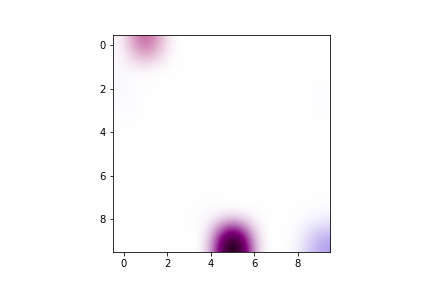

Epoka: 99


<IPython.core.display.Javascript object>


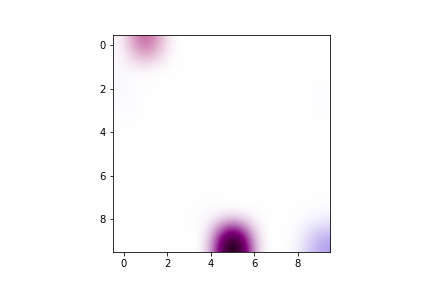

Epoka: 100


<IPython.core.display.Javascript object>


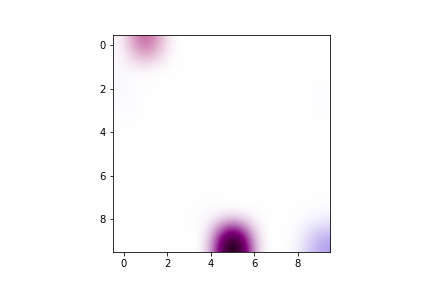

In [36]:
maps_for_return_networks(ret_network_100_100_1_a005_d10_diff)